In [1]:
import pandas as pd
import datetime
import seaborn as sns
import matplotlib.pyplot as plt 
import matplotlib
import numpy as np
from scipy import stats
from pandas.api.types import CategoricalDtype
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 150)

In [2]:
finaldf = pd.read_csv('/Users/Julia/Desktop/bootcamp/DC_capstone/finaldf.csv', low_memory=False)
finaldf.head()

,PRICE,SALE_DATE,SALE_NUM,QUALIFIED,QUADRANT,WARD,SQUARE,NBHD,SUBNBHD,CENSUS_TRACT,CENSUS_BLOCK,ZIPCODE,LATITUDE,LONGITUDE,X,Y,STYLE,STRUCT,USECODE,UNITS,STORIES,GRADE,CNDTN,LANDAREA,GBA,GBA_LIVING,YR_ORIGIN,YR_EXT,YR_RMDL,ROOMS,BEDRMS,BATHRMS,KITCHENS,HEAT,AC,FIREPLACES,ROOF,INTWALL,EXTWALL
0,1095000.0,2003-11-25,1.0,Q,NW,Ward 2,152,Old City 2,040 D Old City 2,4201,004201 2006,20009.0,38.914680,-77.040832,-77.040429,38.914881,3 Story,Row Inside,24.0,2.0,3.0,Very Good,Good,1680.0,2522.0,723.172363,1910.0,1972.0,1988.0,8.0,4.0,4.0,2.0,Warm Cool,Y,5.0,Metal- Sms,Hardwood,Common Brick
1,1602000.0,2006-07-12,1.0,Q,NW,Ward 2,152,Old City 2,040 D Old City 2,4201,004201 2006,20009.0,38.914683,-77.040629,-77.040429,38.914881,3 Story,Row Inside,24.0,2.0,3.0,Very Good,Good,1680.0,2484.0,723.172363,1900.0,1984.0,2003.0,8.0,5.0,3.5,2.0,Hot Water Rad,Y,3.0,Built Up,Hardwood,Common Brick
2,1050000.0,2011-09-29,1.0,Q,NW,Ward 2,152,Old City 2,040 D Old City 2,4201,004201 2005,20009.0,38.915408,-77.040129,-77.040429,38.914881,3 Story,Row Inside,24.0,2.0,3.0,Very Good,Average,1627.0,2401.0,723.172363,1906.0,1972.0,2011.0,8.0,4.0,3.5,2.0,Hot Water Rad,Y,1.0,Metal- Sms,Hardwood,Common Brick
3,1430000.0,2018-05-03,4.0,Q,NW,Ward 2,152,Old City 2,040 D Old City 2,4201,004201 2005,20009.0,38.915017,-77.039903,-77.040429,38.914881,2 Story,Row Inside,24.0,2.0,2.0,Above Average,Very Good,1424.0,1488.0,723.172363,1908.0,1967.0,2008.0,7.0,3.0,3.5,2.0,Warm Cool,Y,1.0,Built Up,Hardwood,Common Brick
4,1325000.0,2011-09-30,1.0,Q,NW,Ward 2,152,Old City 2,040 D Old City 2,4201,004201 2005,20009.0,38.915038,-77.039716,-77.040429,38.914881,2 Story,Row Inside,24.0,2.0,2.0,Above Average,Very Good,1815.0,2692.0,723.172363,1917.0,1967.0,2000.0,5.0,3.0,3.5,2.0,Warm Cool,Y,1.0,Metal- Sms,Hardwood,Stucco


In [3]:
collist = list(finaldf.columns)
for i in collist:
    print("The length of %s is %f and type is %s." % (i, len(finaldf[i].unique()), finaldf.dtypes[i]))

The length of PRICE is 12303.000000 and type is float64.
The length of SALE_DATE is 6496.000000 and type is object.
The length of SALE_NUM is 15.000000 and type is float64.
The length of QUALIFIED is 2.000000 and type is object.
The length of QUADRANT is 4.000000 and type is object.
The length of WARD is 8.000000 and type is object.
The length of SQUARE is 3122.000000 and type is int64.
The length of NBHD is 56.000000 and type is object.
The length of SUBNBHD is 122.000000 and type is object.
The length of CENSUS_TRACT is 176.000000 and type is int64.
The length of CENSUS_BLOCK is 3614.000000 and type is object.
The length of ZIPCODE is 24.000000 and type is float64.
The length of LATITUDE is 51974.000000 and type is float64.
The length of LONGITUDE is 52140.000000 and type is float64.
The length of X is 3122.000000 and type is float64.
The length of Y is 3122.000000 and type is float64.
The length of STYLE is 18.000000 and type is object.
The length of STRUCT is 7.000000 and type is o

/Users/Julia/miniconda3/envs/advanced-pip-example/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


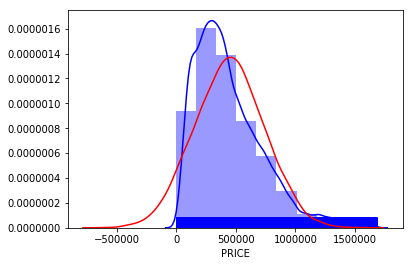

In [4]:
mean = finaldf.PRICE.mean()
sd = finaldf.PRICE.std()

norm = np.random.normal(size=10000, loc=mean, scale=sd)

# would want to do this after means of bootstrapping empirical data. 
# Don't use random sample for the normal distribution because we're using theoretical distribution. 

_ = sns.distplot(finaldf.PRICE, bins=10, rug=True, color='blue')
_ = sns.distplot(norm, hist=False, rug=False, color='red') 

In [5]:
#Shapiro-Wilk Test 
stat, p = stats.shapiro(finaldf.PRICE)
print('Statistic=%.3f, p=%.3f' % (stat, p))
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0).')
else:
    print('Sample does not look Gaussian (reject H0).')

### D’Agostino’s K^2 Test    
stat, p = stats.normaltest(finaldf.PRICE)
print('Statistic=%.3f, p=%.3f' % (stat, p))
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0).')
else:
    print('Sample does not look Gaussian (reject H0).')


Statistic=0.918, p=0.000
Sample does not look Gaussian (reject H0).
Statistic=16431.376, p=0.000
Sample does not look Gaussian (reject H0).


/Users/Julia/miniconda3/envs/advanced-pip-example/lib/python3.7/site-packages/scipy/stats/morestats.py:1309: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


#### TAKEAWAYS:
- The distribution of our data is not normal.


- We will use the Mann Whitney Wilcoxon test whether the distribution of charges differs for two categorical variables.
  - stat, p = stat.mannwhitneyu(data1, data2)
  - minimum of 20 observations per category 
  
  
- We will use the Kruskal-Wallis H-test to test whether the distribution of charges differ for more than two categorical variables. 
  - stat, p = kruskal(data1, data2, data3)
  - minimum of 5 observations per category (of varied sizes)  
  
  
- We will use correlation statistics to determine the effect of continuous variables on charges. 
    - Levene’s test of homogeneity of variance: stats.levene(df['carat'], df['price'])
    - If variance is homogeneous, use Pearson correlation coefficient: test for linear relationship
      - data1.corr(data2)
    - If not, use test for monotonic relationship (variables shift in the same direction)
      - Spearman Rank correlation:  data1.corr(data2, method= 'spearman')
      - Kendall Tau correlation:  data1.corr(data2, method= 'kendall') 
      

In [6]:
finaldf.SALE_DATE = pd.to_datetime(finaldf.SALE_DATE)
price_thousands = finaldf.PRICE / 1000

### SALE_DATE on PRICE:

In [7]:
early = min(finaldf['SALE_DATE'])
times = []
for i in finaldf['SALE_DATE']:
    num = i - early
    times.append(num.total_seconds())

Text(0.5, 1.0, 'Distribution of sale date observations between 1982 and 2018')

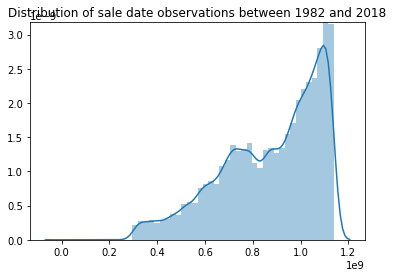

In [8]:
sns.distplot(times)
plt.title("Distribution of sale date observations between 1982 and 2018")

Text(0.5, 1.0, 'Timeseries: Residential Housing Prices')

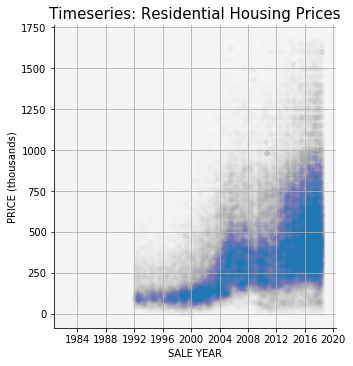

In [9]:
fdf = pd.DataFrame()
fdf['PRICE'] = finaldf['PRICE']
fdf['SALE_DATE'] = finaldf['SALE_DATE']
fdf.PRICE = fdf.PRICE / 1000

sns.set_style({'axes.grid' : True}, rc=({'axes.facecolor':'whitesmoke'}))
sns.relplot(x='SALE_DATE', y='PRICE', kind='scatter', data=fdf, ci='sd', **{'alpha': .005}, edgecolor='none')
plt.xlabel('SALE YEAR')
plt.ylabel('PRICE (thousands)')
plt.title("Timeseries: Residential Housing Prices" ,size=15)

Text(0.5, 1.0, 'Timeseries: Rolling Median Prices')

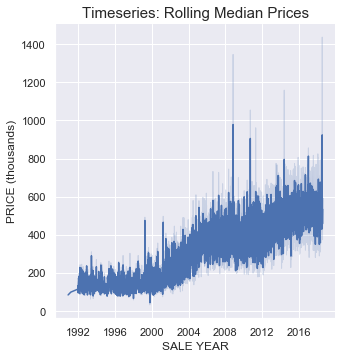

In [10]:
dtdf = finaldf.sort_values(by=(['SALE_DATE']))
rolmed = dtdf['PRICE'].rolling(12).median()
gdf = pd.DataFrame()
gdf['rolmed'] = rolmed
gdf['SALE_DATE'] = dtdf['SALE_DATE']
gdf = gdf.reset_index(drop=True)
gdf.rolmed = gdf.rolmed/1000

sns.set(rc={'figure.figsize':(20,20)})
sns.relplot(x="SALE_DATE", y="rolmed", kind="line", ci="sd", data=gdf)
plt.xlabel('SALE YEAR')
plt.ylabel('PRICE (thousands)')
plt.title("Timeseries: Rolling Median Prices" ,size=15)

/Users/Julia/miniconda3/envs/advanced-pip-example/lib/python3.7/site-packages/pandas/core/indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
/Users/Julia/miniconda3/envs/advanced-pip-example/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


Text(0.5, 1.0, 'Timeseries: Median Housing Prices Per Year, 1992-2018')

<Figure size 720x720 with 0 Axes>

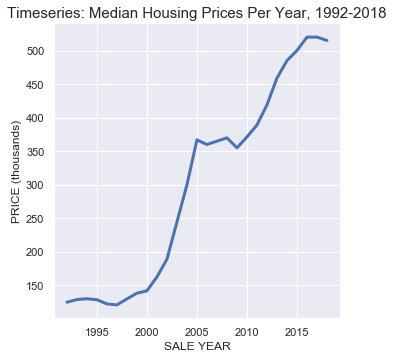

In [11]:
start_date= '01-01-1992'
end_date = '12-31-2018'
mask = (finaldf.SALE_DATE >= start_date) & (finaldf.SALE_DATE <= end_date)
brdf = finaldf.loc[mask]

###
bdf = brdf[['SALE_DATE', 'PRICE']]
SALE_YR = brdf.SALE_DATE.dt.strftime('%Y')
bdf.loc[:, 'SALE_YR'] = SALE_YR
bdf = bdf.drop(['SALE_DATE'], axis=1)

bdf.SALE_YR = bdf.SALE_YR.astype('int')
bdf.PRICE = bdf.PRICE/1000

#groupby to get median price 
bdf = bdf.groupby(['SALE_YR'])['PRICE'].median()
bdf = bdf.reset_index(level=['SALE_YR'])

plt.figure(figsize = (10, 10))
sns.relplot(data=bdf, x='SALE_YR', y='PRICE', kind='line', markers=True, ci="sd", linewidth=3)
plt.xlabel('SALE YEAR')
plt.ylabel('PRICE (thousands)')
plt.title("Timeseries: Median Housing Prices Per Year, 1992-2018" ,size=15)


tdf = finaldf.copy()
tdf['TIME'] = times

#Test for homogeneity of variance:
stat, p = stats.levene(tdf['TIME'], tdf['PRICE'])
print('Statistic=%.3f, p=%.3f' % (stat, p))
if p > alpha:
    print('Variance is homogeneous (fail to reject H0).')
else:
    print('Variance is not homogeneous (reject H0).')
    
#Test for monotonic relationship:
r = tdf['PRICE'].corr(tdf['TIME'], method='spearman')
if r > .7:
    print("The correlation coefficient: %.3f indicates a strong monotonic relationship" % r) 
elif r > .3:
    print("The correlation coefficient: %.3f indicates a moderate monotonic relationship" % r) 
elif r > .1:
    print("The correlation coefficient: %.3f indicates a weak monotonic relationship" % r) 
elif r > -.1:
    print("The correlation coefficient: %.3f indicates a negligible monotonic relationship." % r) 
elif r > -.3:
    print("The correlation coefficient: %.3f indicates a weak monotonic relationship" % r)
elif r > -.7:
    print("The correlation coefficient: %.3f indicates a moderate monotonic relationship" % r) 
else:
    print("The correlation coefficient: %.3f indicates a strong monotonic relationship" % r)
 
plt.figure(figsize=(7, 7))
sns.regplot(x=tdf['TIME'], y=tdf['PRICE'],lowess=True, \
                 scatter_kws={'alpha':.1, 'color':'purple'}, fit_reg=True)

#### TAKEAWAYS:
* The distribution of sale dates is not evenly distributed.
* Most observations occurred between 1992 and 2018, with more observations for the most recent years
* Stagnation in years 2005-2009 and 2016-2018
* Dip in 2009
* There is a moderately positive linear relationship of time and price. 

### SALE_NUM on PRICE

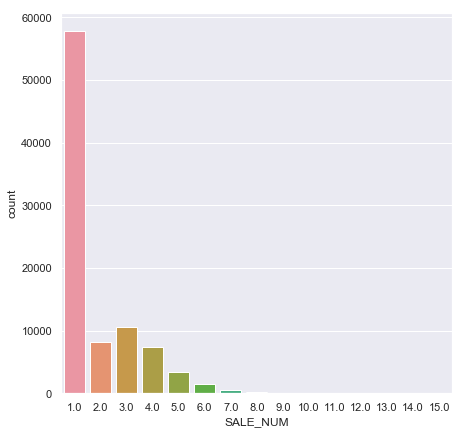

In [12]:
plt.figure(figsize=(7, 7))
sns.countplot(finaldf.SALE_NUM)

Text(0.5, 1.0, 'Housing Prices per Sale Number')

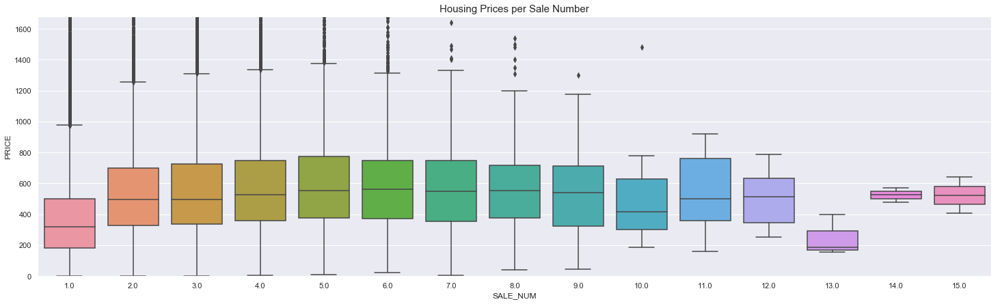

In [13]:
numlist = list(finaldf.SALE_NUM)
numlist.sort()
uniquelist = list(set(numlist))
uniquelist

cat_type = CategoricalDtype(uniquelist, ordered=True)
salenum = finaldf.SALE_NUM.astype(cat_type)

finaldf.SALE_NUM = salenum

plt.figure(figsize = (25, 7))
g = sns.boxplot(finaldf.SALE_NUM, price_thousands)
g.set(ylim=(0, max(price_thousands)))
plt.title("Housing Prices per Sale Number" ,size=15)

#### TAKEAWAYS:
*  There are fewer sales for higher sale numbers, so data is less centralized and perhaps meaningful for a sale number of 10 or higher.
*  It appears that SALE 1 has lower prices than the other sale numbers.

### QUALIFIED ON PRICES:

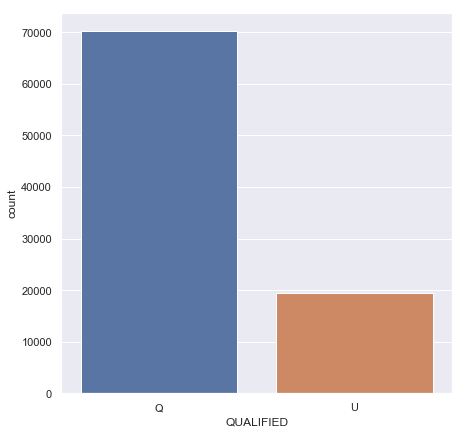

In [14]:
plt.figure(figsize=(7, 7))
sns.countplot(finaldf.QUALIFIED)

/Users/Julia/miniconda3/envs/advanced-pip-example/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


Text(0, 0.5, 'PRICE (THOUSANDS OF USD)')

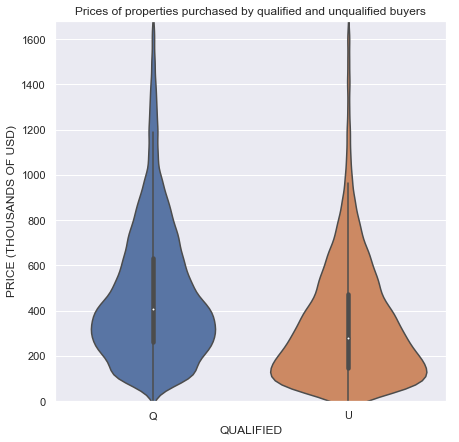

In [15]:
plt.figure(figsize=(7, 7))
g = sns.violinplot(x=finaldf.QUALIFIED, y=price_thousands)
g.set(ylim=(0, max(price_thousands)))
plt.title("Prices of properties purchased by qualified and unqualified buyers")
plt.ylabel('PRICE (THOUSANDS OF USD)')

In [16]:
stat, p = stats.mannwhitneyu(finaldf[(finaldf['QUALIFIED']=='Q')]['PRICE'], finaldf[(finaldf['QUALIFIED']=='U')]['PRICE'])
print('Statistic=%.3f, p=%.3f' % (stat, p))
if p > alpha:
    print('The charge distributions are different between groups (fail to reject H0).')
else:
    print('The charge distributions are different between groups (reject H0).')

Statistic=483289132.500, p=0.000
The charge distributions are different between groups (reject H0).


#### TAKEAWAYS:
* Unqualified buyers generally buy lower priced properties
* The range of the value for properties purchased by qualified and unqualified buyers is the same

### QUADRANTS ON PRICES:

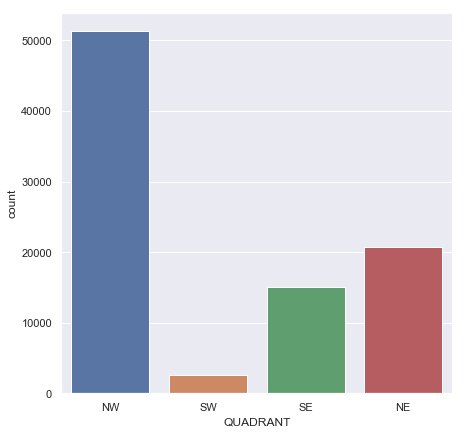

In [17]:
plt.figure(figsize=(7, 7))
sns.countplot(finaldf.QUADRANT)

Text(0.5, 1.0, 'Prices of properties in various quadrants')

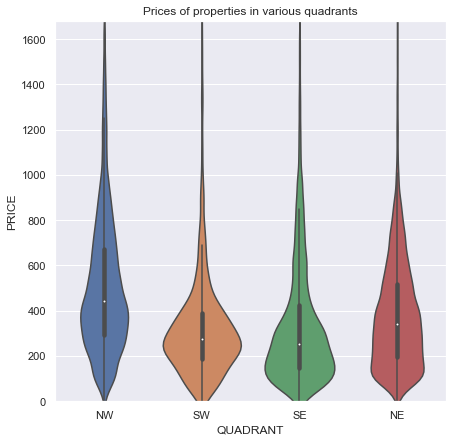

In [18]:
plt.figure(figsize=(7, 7))
g = sns.violinplot(x=finaldf.QUADRANT, y=price_thousands)
g.set(ylim=(0, max(price_thousands)))
plt.title("Prices of properties in various quadrants")

In [19]:
#Test for equal distribution:
stat, p = stats.kruskal(finaldf[(finaldf['QUADRANT']=='SE')]['PRICE'], finaldf[(finaldf['QUADRANT']=='SW')]['PRICE'], 
            finaldf[(finaldf['QUADRANT']=='NE')]['PRICE'], finaldf[(finaldf['QUADRANT']=='NW')]['PRICE'])
                        
print('Statistic=%.3f, p=%.3f' % (stat, p))
if p > alpha:
    print('The charge distributions are different between groups (fail to reject H0).')
else:
    print('The charge distributions are different between groups (reject H0).')

Statistic=7559.823, p=0.000
The charge distributions are different between groups (reject H0).


#### TAKEAWAYS:
* Quadrants have an impact on price.
* SE generally has the lowest prices.
* NW generally has the highest prices.
* SW has the the most normal price distribution.

### WARD ON PRICES:

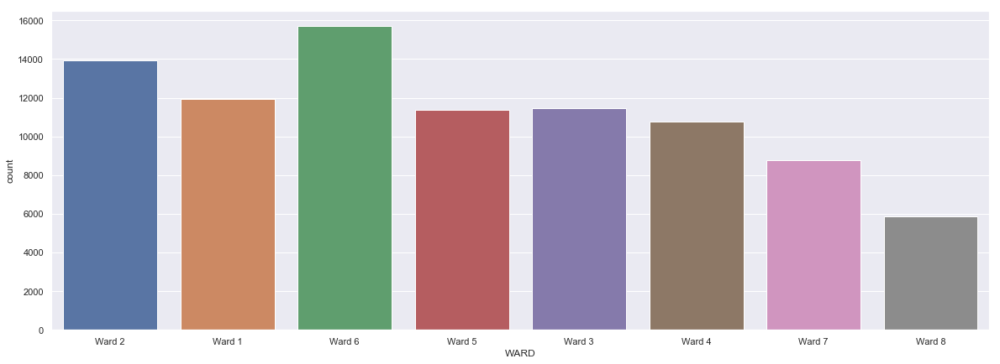

In [20]:
plt.figure(figsize=(20, 7))
sns.countplot(finaldf.WARD)

In [21]:
#Test for equal distribution:
stat, p = stats.kruskal(finaldf[(finaldf['QUADRANT']=='SE')]['PRICE'], finaldf[(finaldf['QUADRANT']=='SW')]['PRICE'], 
            finaldf[(finaldf['QUADRANT']=='NE')]['PRICE'], finaldf[(finaldf['QUADRANT']=='NW')]['PRICE'])
                        
print('Statistic=%.3f, p=%.3f' % (stat, p))
if p > alpha:
    print('The charge distributions are different between groups (fail to reject H0).')
else:
    print('The charge distributions are different between groups (reject H0).')

Statistic=7559.823, p=0.000
The charge distributions are different between groups (reject H0).


Text(0.5, 1.0, 'Prices of properties in various wards')

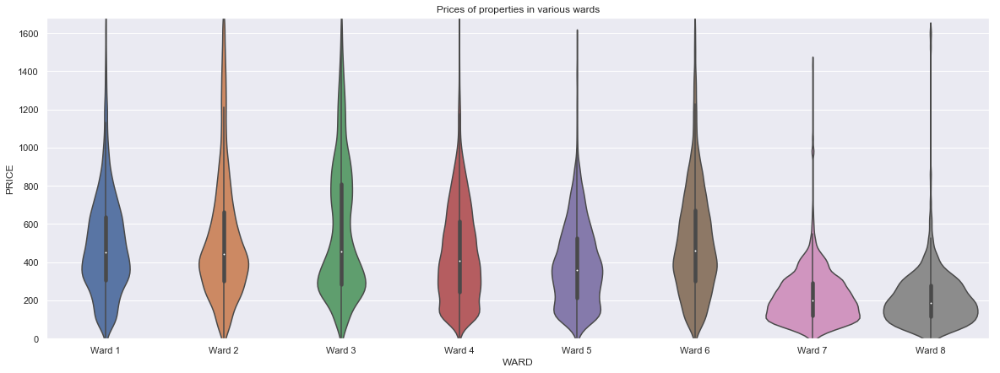

In [22]:
cat_type = pd.api.types.CategoricalDtype(
            categories=["Ward 1", "Ward 2", "Ward 3", "Ward 4", \
                    "Ward 5", "Ward 6", "Ward 7", "Ward 8"], ordered=True)
finaldf.WARD = finaldf['WARD'].astype(cat_type)


plt.figure(figsize=(20, 7))
g = sns.violinplot(x=finaldf.WARD, y=price_thousands)
g.set(ylim=(0, max(price_thousands)))
plt.title("Prices of properties in various wards")

In [23]:
finaldf.WARD.value_counts()

Ward 6    15715
Ward 2    13915
Ward 1    11918
Ward 3    11442
Ward 5    11356
Ward 4    10770
Ward 7     8751
Ward 8     5885
Name: WARD, dtype: int64

Text(0.5, 1.0, 'Prices of properties in various wards')

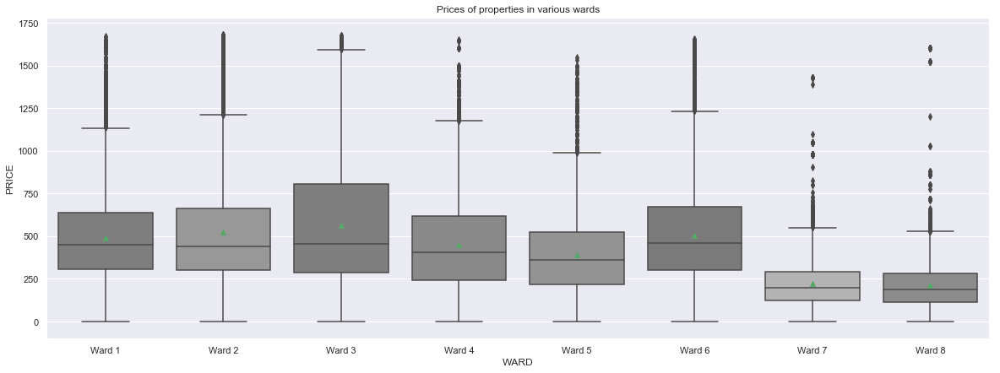

In [24]:
plt.figure(figsize=(20, 7))
g = sns.boxplot(x=finaldf.WARD, y=price_thousands, showmeans=True, saturation=0)
g.set(ylim=(-100, max(price_thousands)+100))
plt.title("Prices of properties in various wards")

In [25]:
stat, p = stats.kruskal(finaldf[(finaldf['WARD']=='Ward 1')]['PRICE'], finaldf[(finaldf['WARD']=='Ward 2')]['PRICE'], 
            finaldf[(finaldf['WARD']=='Ward 3')]['PRICE'], finaldf[(finaldf['WARD']=='Ward 4')]['PRICE'], 
            finaldf[(finaldf['WARD']=='Ward 5')]['PRICE'], finaldf[(finaldf['WARD']=='Ward 6')]['PRICE'], 
            finaldf[(finaldf['WARD']=='Ward 7')]['PRICE'], finaldf[(finaldf['WARD']=='Ward 8')]['PRICE'])           

print('Statistic=%.3f, p=%.3f' % (stat, p))
if p > alpha:
    print('Variance is homogeneous (fail to reject H0).')
else:
    print('Variance is not homogeneous (reject H0).')

Statistic=16463.074, p=0.000
Variance is not homogeneous (reject H0).


#### TAKEAWAYS:
* WARDS 7 and 8 generally have the lowest prices
* WARD 3 has the highest property values

In [26]:
### SQUARES ON PRICE:

<Figure size 1440x720 with 0 Axes>

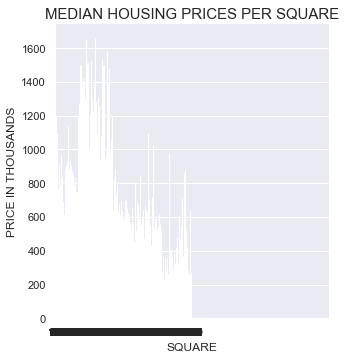

In [27]:
sq = pd.DataFrame()
sq['PRICE'] = price_thousands
sq['SQUARE'] = finaldf.SQUARE
sq.sort_values('SQUARE')
sq = sq.groupby(['SQUARE']).median()
sq = sq.reset_index(level=['SQUARE'])

sq.SQUARE.astype('category')

plt.figure(figsize=(20,10))
g = sns.catplot('SQUARE', 'PRICE', data=sq, kind='bar')
plt.title('MEDIAN HOUSING PRICES PER SQUARE', size=15)
plt.xlabel('SQUARE')
plt.ylabel('PRICE IN THOUSANDS')
g.set(xlim=(min(finaldf.SQUARE), max(finaldf.SQUARE)))

##### NOTE:
* Squares are calculated by the outer extents of the record or tax lots within a defined area (typically a city block)
* Prices are clustered for squares in different ranges (ex: 5000-6000)
* Question: How are square numbers determined and do they have a relaitonship to ward / geographical location?
  * We can explore ranges of square numbers for various wards to examine relationship.

### NEIGHBORHOOD ON PRICE:

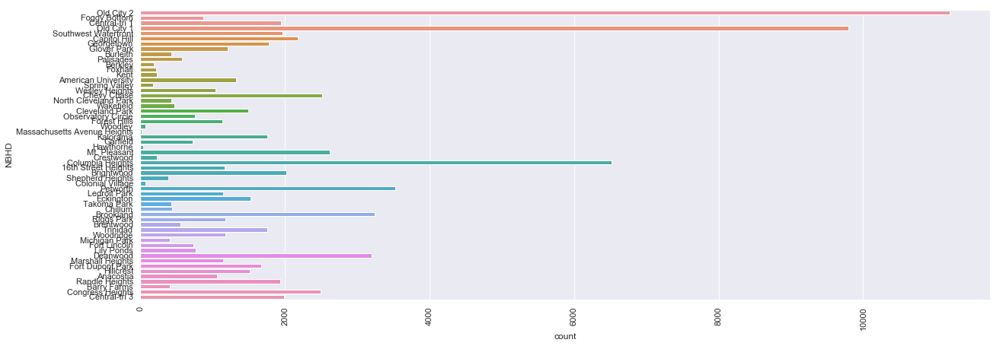

In [28]:
plt.figure(figsize=(20, 7))
a = sns.countplot(y=finaldf.NBHD)
a.tick_params(axis= 'x', rotation=90)

Text(0.5, 1.0, 'Prices per Neighborhood')

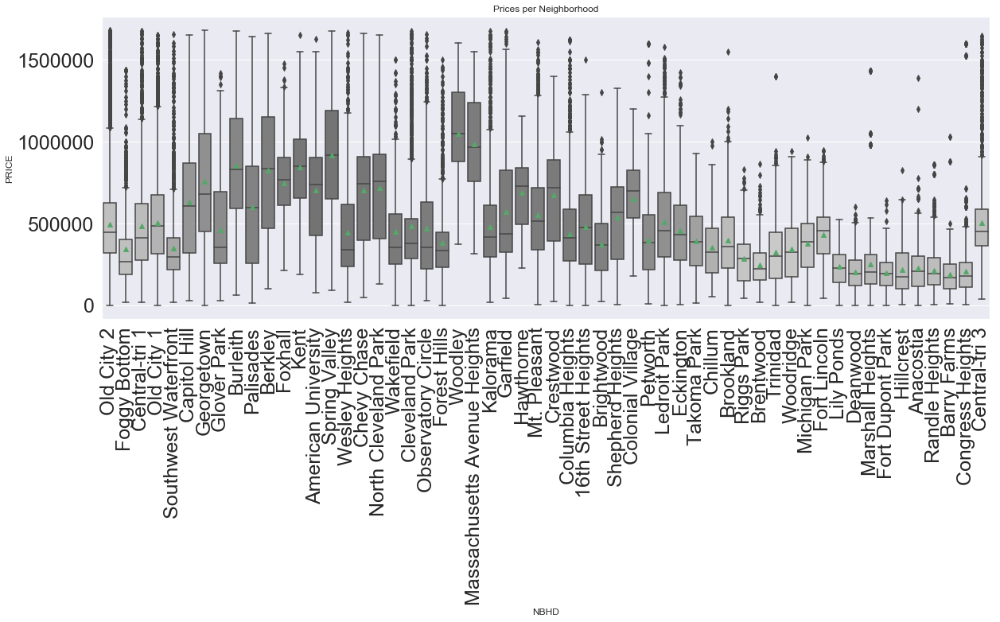

In [29]:
finaldf.NBHD.astype('category')

plt.figure(figsize = (20, 7))
g = sns.boxplot(x='NBHD', y='PRICE', data=finaldf, showmeans=True, saturation=0)
g.tick_params(axis= 'x', labelsize=25, rotation=90)
g.tick_params(axis= 'y', labelsize=25)
plt.title("Prices per Neighborhood")

#### TAKEAWAYS:
* Neighborhood appears to have a strong impact on price.
* There may be a correlation between neighborhood and ward, or neighborhood and subneighborhood. 

### SUBNEIGHBORHOODS ON PRICE:

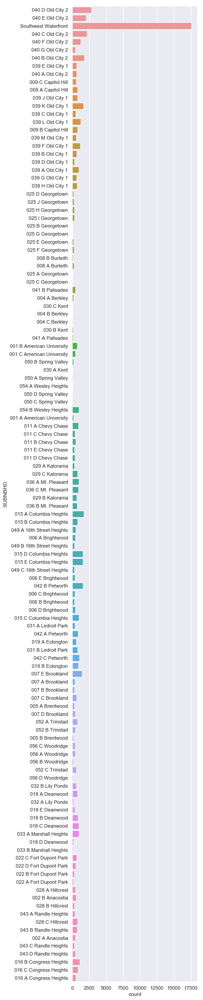

In [30]:
plt.figure(figsize=(5, 40))
a = sns.countplot(y=finaldf.SUBNBHD)

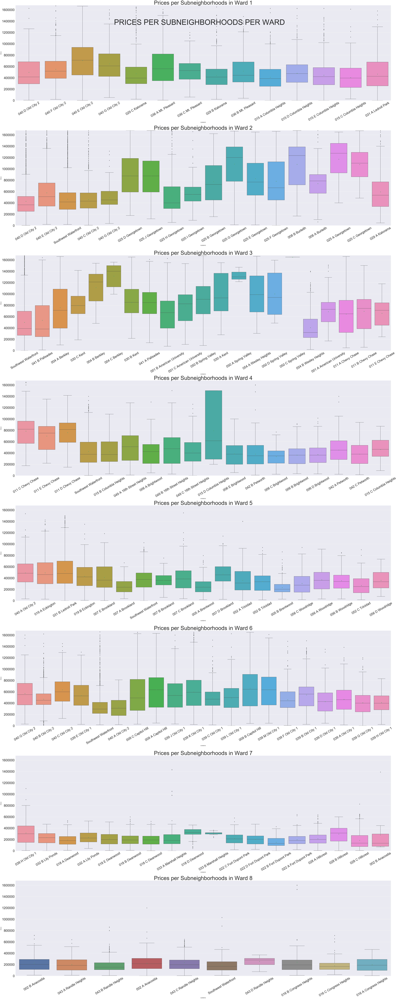

In [31]:
onedf = finaldf[(finaldf['WARD']=='Ward 1')]
twodf = finaldf[(finaldf['WARD']=='Ward 2')]
threedf = finaldf[(finaldf['WARD']=='Ward 3')]
fourdf = finaldf[(finaldf['WARD']=='Ward 4')]
fivedf = finaldf[(finaldf['WARD']=='Ward 5')]
sixdf = finaldf[(finaldf['WARD']=='Ward 6')]
sevendf = finaldf[(finaldf['WARD']=='Ward 7')]
eightdf = finaldf[(finaldf['WARD']=='Ward 8')]

fig, axarr = plt.subplots(8, 1, sharey=True, figsize=(60, 150))
fig.suptitle('PRICES PER SUBNEIGHBORHOODS PER WARD', fontsize=80)   
for i in range(8):
    axarr[i].set_ylim(0, ((max(finaldf.PRICE))+1))
       
zero = sns.boxplot(x='SUBNBHD', y='PRICE', data=onedf, ax=axarr[0], showmeans=True)
axarr[0].set_title("Prices per Subneighborhoods in Ward 1", size=60)             
zero.tick_params(axis= 'x', labelsize=35, rotation=30)
zero.tick_params(axis= 'y', labelsize=35)

one = sns.boxplot(x='SUBNBHD', y='PRICE', data=twodf, ax=axarr[1], showmeans=True)
axarr[1].set_title("Prices per Subneighborhoods in Ward 2", size=60)             
one.tick_params(axis= 'x', labelsize=35, rotation=30)
one.tick_params(axis= 'y', labelsize=35)
                   
two = sns.boxplot(x='SUBNBHD', y='PRICE', data=threedf, ax=axarr[2], showmeans=True)
axarr[2].set_title("Prices per Subneighborhoods in Ward 3", size=60)             
two.tick_params(axis= 'x', labelsize=35, rotation=30)
two.tick_params(axis= 'y', labelsize=35)
                   
three = sns.boxplot(x='SUBNBHD', y='PRICE', data=fourdf, ax=axarr[3], showmeans=True)
axarr[3].set_title("Prices per Subneighborhoods in Ward 4", size=60)             
three.tick_params(axis= 'x', labelsize=35, rotation=30)
three.tick_params(axis= 'y', labelsize=35)
                   
four = sns.boxplot(x='SUBNBHD', y='PRICE', data=fivedf, ax=axarr[4], showmeans=True)
axarr[4].set_title("Prices per Subneighborhoods in Ward 5", size=60)             
four.tick_params(axis= 'x', labelsize=35, rotation=30)
four.tick_params(axis= 'y', labelsize=35)
                   
five = sns.boxplot(x='SUBNBHD', y='PRICE', data=sixdf, ax=axarr[5], showmeans=True)
axarr[5].set_title("Prices per Subneighborhoods in Ward 6", size=60)             
five.tick_params(axis= 'x', labelsize=35, rotation=30)
five.tick_params(axis= 'y', labelsize=35)    

six = sns.boxplot(x='SUBNBHD', y='PRICE', data=sevendf, ax=axarr[6], showmeans=True)
axarr[6].set_title("Prices per Subneighborhoods in Ward 7", size=60)             
six.tick_params(axis= 'x', labelsize=35, rotation=30)
six.tick_params(axis= 'y', labelsize=35)
                   
seven = sns.boxplot(x='SUBNBHD', y='PRICE', data=eightdf, ax=axarr[7], showmeans=True)
axarr[7].set_title("Prices per Subneighborhoods in Ward 8", size=60)             
seven.tick_params(axis= 'x', labelsize=35, rotation=30)
seven.tick_params(axis= 'y', labelsize=35)
    
plt.tight_layout()

In [32]:
finaldf.SUBNBHD.value_counts()

Southwest Waterfront         17566
040 D Old City 2              2852
040 C Old City 2              2190
040 E Old City 2              2017
040 B Old City 2              1773
015 A Columbia Heights        1675
039 K Old City 1              1661
042 B Petworth                1600
015 E Columbia Heights        1545
015 D Columbia Heights        1543
007 E Brookland               1424
040 F Old City 2              1233
039 L Old City 1              1232
039 F Old City 1              1196
016 B Congress Heights        1141
042 C Petworth                1075
039 A Old City 1              1006
033 A Marshall Heights        1003
018 C Deanwood                 980
036 A Mt. Pleasant             976
054 B Wesley Heights           966
015 C Columbia Heights         963
036 C Mt. Pleasant             945
019 B Eckington                923
011 A Chevy Chase              895
018 B Deanwood                 875
016 C Congress Heights         863
042 A Petworth                 849
015 B Columbia Heigh

#### TAKEAWAYS:
* There is significant variation in prices in subneighborhoods in Wards 2 and 3
* "Columbia Heights" properties are very expensive. 

### CENSUS TRACT ON PRICE:

Text(5.960000000000001, 0.5, 'PRICE IN THOUSANDS')

<Figure size 1440x648 with 0 Axes>

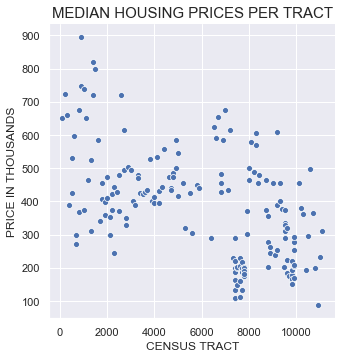

In [33]:
ct = pd.DataFrame()
ct['PRICE'] = price_thousands
ct['CENSUS_TRACT'] = finaldf.CENSUS_TRACT
ct = ct.groupby(['CENSUS_TRACT']).median()
ct = ct.reset_index(['CENSUS_TRACT'])

plt.figure(figsize=(20, 9))
sns.relplot('CENSUS_TRACT', 'PRICE', data=ct)
plt.title('MEDIAN HOUSING PRICES PER TRACT', size=15)
plt.xlabel('CENSUS TRACT')
plt.ylabel('PRICE IN THOUSANDS')

#### TAKEAWAYS:
* We must consider census tract as a categorical variable.
* Census tract does have an impact on prices.
* Tracts have huge differences in median housing prices. 

### CENSUS BLOCK ON PRICE:

[(array([0.]), array([1.]))]

<Figure size 1440x648 with 0 Axes>

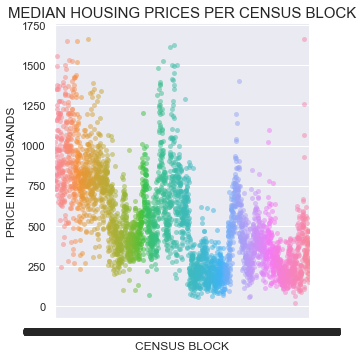

In [34]:
cb = pd.DataFrame()
cb['PRICE'] = price_thousands
cb['CENSUS_BLOCK'] = finaldf.CENSUS_BLOCK
cb = cb.groupby(['CENSUS_BLOCK']).median()
cb = cb.reset_index(['CENSUS_BLOCK'])

plt.figure(figsize=(20,9))
sns.catplot('CENSUS_BLOCK', 'PRICE', data=cb, alpha=.5)
plt.title('MEDIAN HOUSING PRICES PER CENSUS BLOCK', size=15)
plt.xlabel('CENSUS BLOCK')
plt.ylabel('PRICE IN THOUSANDS')
g.set(xlim=(min(cb.CENSUS_BLOCK), max(cb.CENSUS_BLOCK)))

#### TAKEAWAYS:
* We must consider census tract as a categorical variable.
* Census block does have an impact on prices.
* Tracts have huge differences in median housing prices. 

### ZIPCODES ON PRICE:

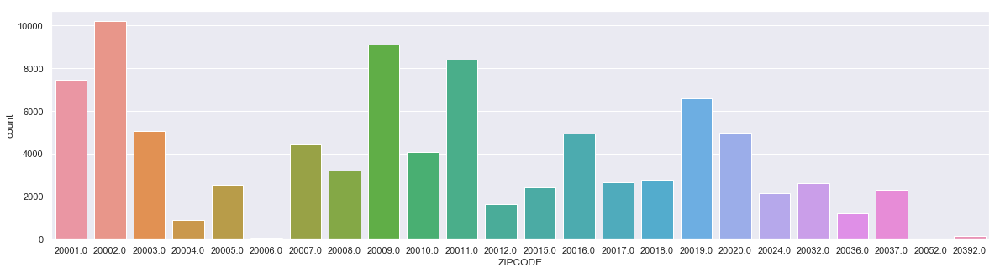

In [35]:
plt.figure(figsize=(20, 5))
a = sns.countplot(finaldf.ZIPCODE)

Text(0, 0.5, 'PRICE (THOUSANDS OF USD)')

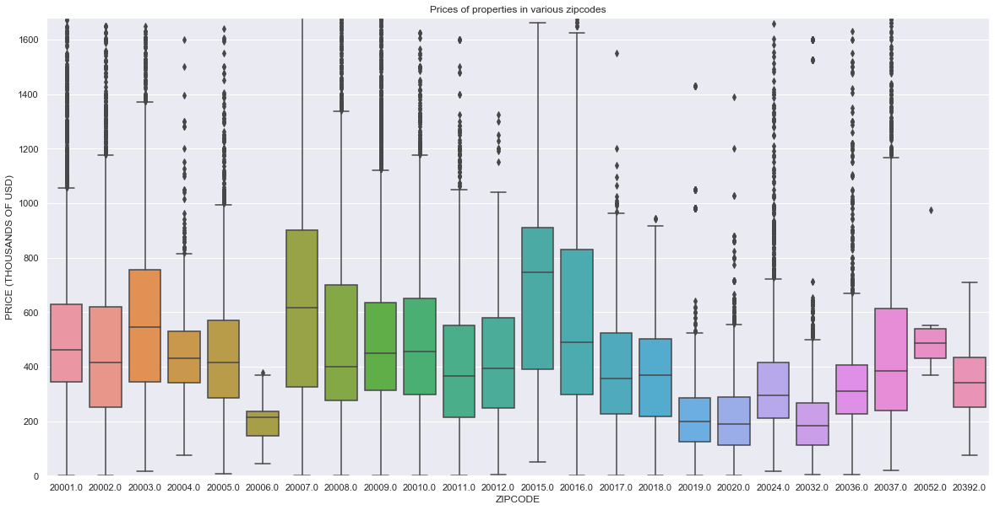

In [36]:
decimals = 0
finaldf['ZIPCODE'] = finaldf['ZIPCODE'].apply(lambda x: round(x, decimals))

plt.figure(figsize=(20, 10))
g = sns.boxplot(x=finaldf.ZIPCODE, y=price_thousands)
g.set(ylim=(0, max(price_thousands)))
plt.title("Prices of properties in various zipcodes")
plt.ylabel('PRICE (THOUSANDS OF USD)')

#### TAKEAWAYS:
* Zipcode does have an effect on prices.

### X and Latitude, Y and Longitude

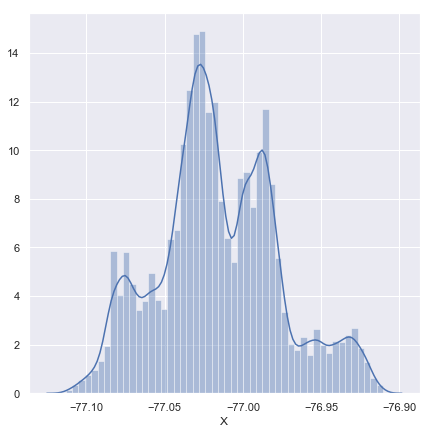

In [38]:
plt.figure(figsize=(7,7))
sns.distplot(finaldf.X)

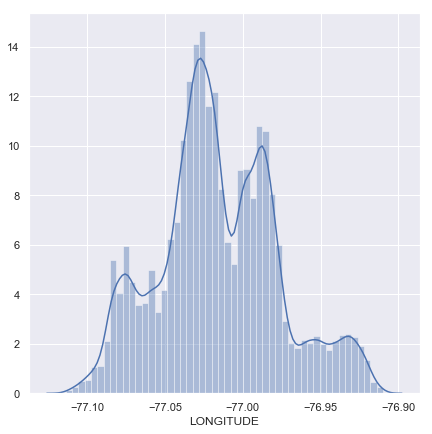

In [39]:
plt.figure(figsize=(7,7))
sns.distplot(finaldf.LONGITUDE)

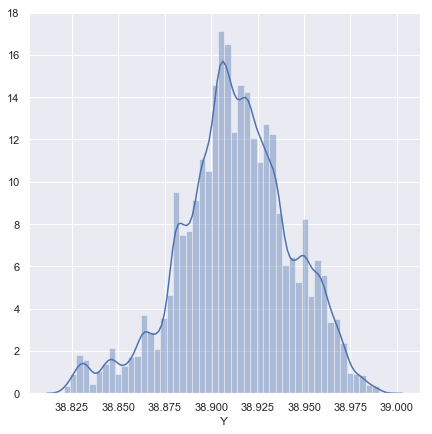

In [40]:
plt.figure(figsize=(7,7))
sns.distplot(finaldf.Y)

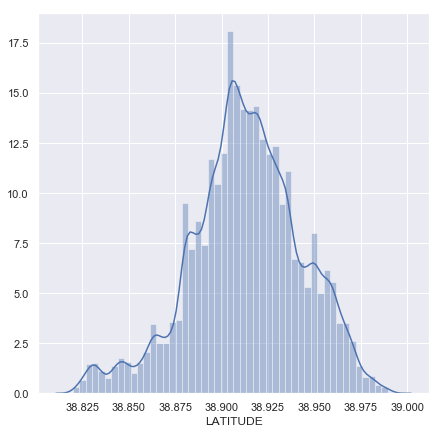

In [41]:
plt.figure(figsize=(7,7))
sns.distplot(finaldf.LATITUDE)

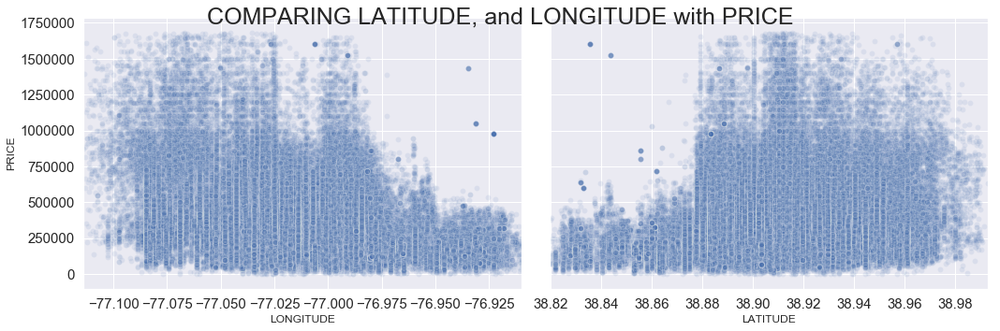

In [42]:
fig, axarr = plt.subplots(1, 2, sharey=True, sharex=False, figsize=(15, 5))
fig.suptitle('COMPARING LATITUDE, and LONGITUDE with PRICE', fontsize=25)  

zero = sns.relplot(x='LONGITUDE', y='PRICE', data=finaldf, ax=axarr[0], alpha=.1)             
axarr[0].tick_params(axis= 'x', labelsize=15)
axarr[0].tick_params(axis= 'y', labelsize=15)
axarr[0].set_xlim(min(finaldf.LONGITUDE), max(finaldf.LONGITUDE))
    
one = sns.relplot(x='LATITUDE', y='PRICE', data=finaldf, ax=axarr[1], alpha=.1)             
axarr[1].tick_params(axis= 'x', labelsize=15)
axarr[1].tick_params(axis= 'y', labelsize=15)
axarr[1].set_xlim(min(finaldf.LATITUDE), max(finaldf.LATITUDE))

plt.close(zero.fig)
plt.close(one.fig) 

plt.tight_layout()


In [43]:
# TESTS ON LONGITUDE:

#Test for homogeneity of variance:
stat, p = stats.levene(finaldf['PRICE'], finaldf['LONGITUDE'])
print('Statistic=%.3f, p=%.3f' % (stat, p))
if p > alpha:
    print('Variance is homogeneous (fail to reject H0).')
else:
    print('Variance is not homogeneous (reject H0).')
    
#Test for correlation:
r = finaldf['PRICE'].corr(finaldf['X'], method='spearman')
if r > .7:
    print("The correlation coefficient: %.3f indicates a strong positive monotonic relationship" % r) 
elif r > .3:
    print("The correlation coefficient: %.3f indicates a moderate positive monotonic relationship" % r) 
elif r > .1:
    print("The correlation coefficient: %.3f indicates a weak positive monotonic relationship" % r) 
elif r > -.1:
    print("The correlation coefficient: %.3f indicates a negligible monotonic relationship." % r) 
elif r > -.3:
    print("The correlation coefficient: %.3f indicates a weak negative monotonic relationship" % r)
elif r > -.7:
    print("The correlation coefficient: %.3f indicates a moderate negative monotonic relationship" % r) 
else:
    print("The correlation coefficient: %.3f indicates a strong negative monotonic relationship" % r)
    
plt.figure(figsize(7,7))
sns.regplot(x=finaldf['X'], y=finaldf['PRICE'],lowess=True, \
                 scatter_kws={'alpha':.1, 'color':'purple'}, fit_reg=True)

Statistic=108041.680, p=0.000
Variance is not homogeneous (reject H0).
The correlation coefficient: -0.325 indicates a moderate negative monotonic relationship


NameError: name 'figsize' is not defined

In [ ]:
# TESTS ON LATITUDE:

#Test for homogeneity of variance:
stat, p = stats.levene(finaldf['PRICE'], finaldf['LATITUDE'])
print('Statistic=%.3f, p=%.3f' % (stat, p))
if p > alpha:
    print('Variance is homogeneous (fail to reject H0).')
else:
    print('Variance is not homogeneous (reject H0).')
    
#Test for correlation:
r = finaldf['PRICE'].corr(finaldf['Y'], method='spearman')
if r > .7:
    print("The correlation coefficient: %.3f indicates a strong positive linear relationship" % r) 
elif r > .3:
    print("The correlation coefficient: %.3f indicates a moderate positive linear relationship" % r) 
elif r > .1:
    print("The correlation coefficient: %.3f indicates a weak positive linear relationship" % r) 
elif r > -.1:
    print("The correlation coefficient: %.3f indicates a negligible linear relationship." % r) 
elif r > -.3:
    print("The correlation coefficient: %.3f indicates a weak negative linear relationship" % r)
elif r > -.7:
    print("The correlation coefficient: %.3f indicates a moderate negative linear relationship" % r) 
else:
    print("The correlation coefficient: %.3f indicates a strong negative linear relationship" % r)
    
plt.figure(figsize(7,7))
sns.regplot(x=finaldf['Y'], y=finaldf['PRICE'],lowess=True, \
                 scatter_kws={'alpha':.1, 'color':'purple'}, fit_reg=True)

#### TAKEAWAYS:
* Longitude has a moderately negative impact on price.
* Latitude has a weak positive impact on price. 

### STYLE ON PRICE: 

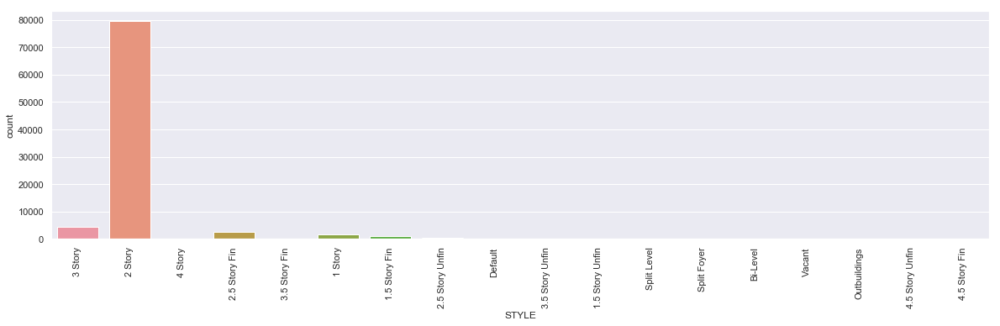

In [44]:
plt.figure(figsize=(20,5))
a = sns.countplot(finaldf.STYLE)
a.tick_params(axis='x', rotation=90)

Text(0.5, 0, 'STYLE')

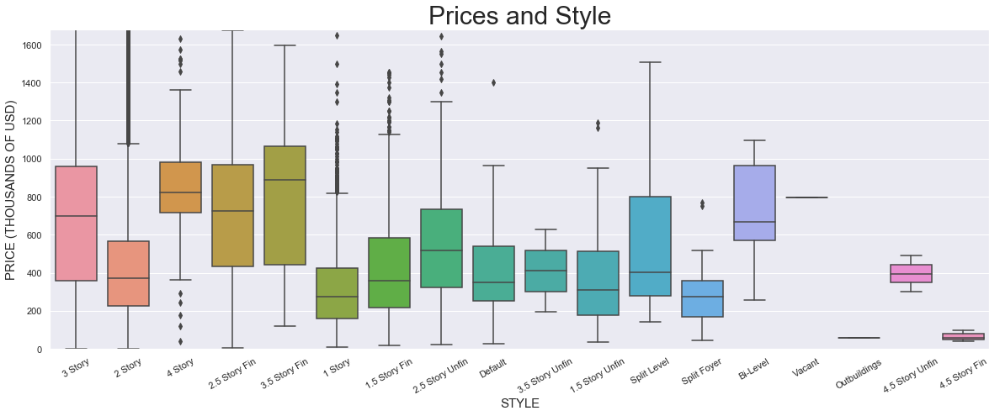

In [45]:
plt.figure(figsize=(20, 7))
g = sns.boxplot(x=finaldf.STYLE, y=price_thousands)
g.set(ylim=(0, max(price_thousands)))
g.tick_params(axis='x', rotation=30)
plt.title("Prices and Style", size=30)
plt.ylabel('PRICE (THOUSANDS OF USD)', size=15)
plt.xlabel('STYLE', size=15)

#### TAKEAWAYS:
* Style does have an impact on price. 
* There is only one observation for 'Outbuildings' and 'Vacant'

### STRUCTURE ON PRICE:

In [46]:
finaldf.STRUCT.value_counts().sort_index()

Multi             2112
Row End           6576
Row Inside       60665
Semi-Detached     7997
Single           12142
Town End            76
Town Inside        184
Name: STRUCT, dtype: int64

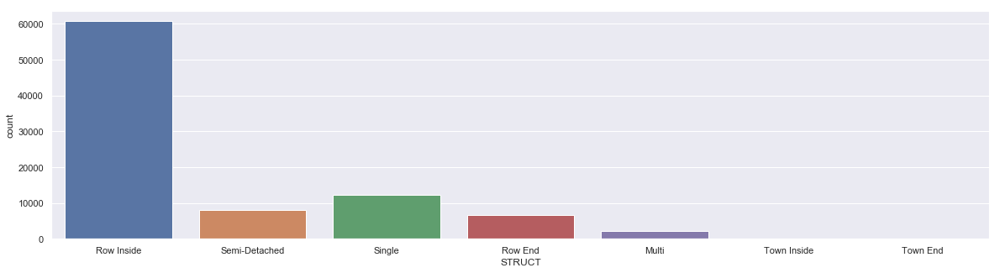

In [47]:
plt.figure(figsize=(20,5))
a = sns.countplot(finaldf.STRUCT)

Text(0.5, 0, 'STRUCTURE')

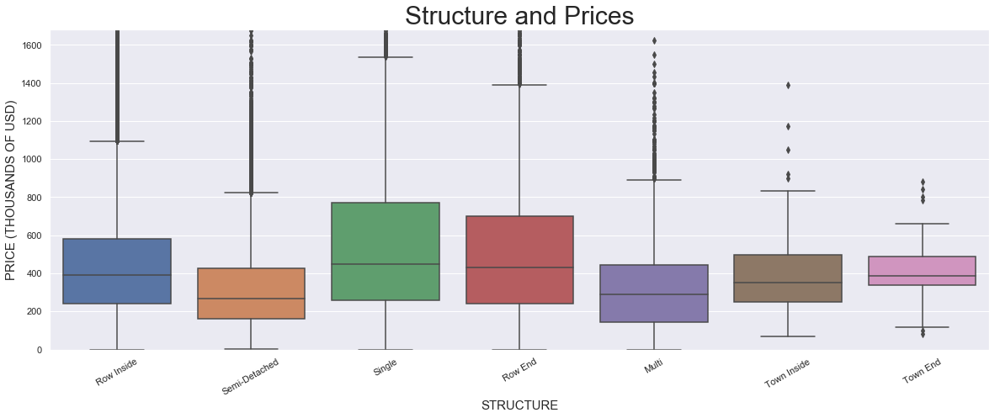

In [48]:
sns.set()
plt.figure(figsize=(20, 7))
g = sns.boxplot(x=finaldf.STRUCT, y=price_thousands)
g.set(ylim=(0, max(price_thousands)))
g.tick_params(axis='x', rotation=30)
plt.title("Structure and Prices", size=30)
plt.ylabel('PRICE (THOUSANDS OF USD)', size=15)
plt.xlabel('STRUCTURE', size=15)

In [49]:
finaldf.STRUCT.value_counts()

Row Inside       60665
Single           12142
Semi-Detached     7997
Row End           6576
Multi             2112
Town Inside        184
Town End            76
Name: STRUCT, dtype: int64

#### TAKEAWAYS:
* Structure does impact Price
* Semi-Detached and Multi cost the least
* Town End has the most normal distribution, with properties hovering around 380k.

### USECODE ON PRICE:

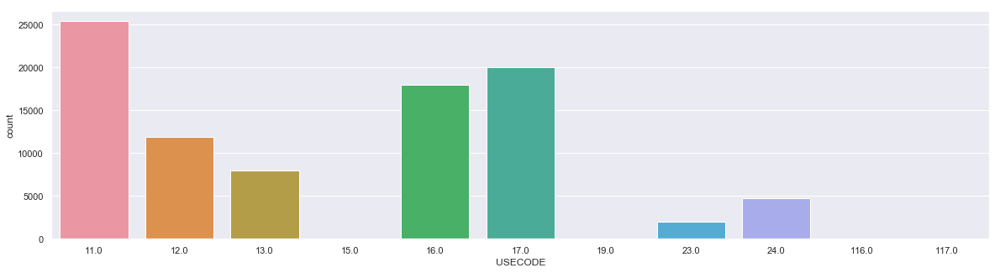

In [50]:
plt.figure(figsize=(20,5))
a = sns.countplot(finaldf.USECODE)

Text(0.5, 0, 'USECODE')

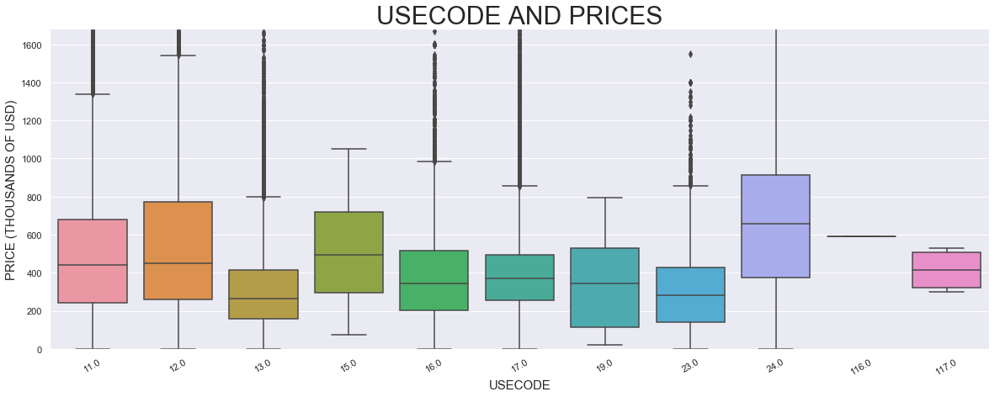

In [51]:
plt.figure(figsize=(20, 7))
g = sns.boxplot(x=finaldf.USECODE, y=price_thousands)
g.set(ylim=(0, max(price_thousands)))
g.tick_params(axis='x', rotation=30)
plt.title("USECODE AND PRICES", size=30)
plt.ylabel('PRICE (THOUSANDS OF USD)', size=15)
plt.xlabel('USECODE', size=15)

In [52]:
finaldf.USECODE.value_counts()

11.0     25336
17.0     19980
16.0     17953
12.0     11889
13.0      7912
24.0      4680
23.0      1966
15.0        24
19.0         7
117.0        4
116.0        1
Name: USECODE, dtype: int64

#### TAKEAWAYS:
* Housing codes do have some impact on prices.
* Meaning of housing codes (https://otr.cfo.dc.gov/sites/default/files/dc/sites/otr/publication/attachments/Use%20codes.pdf):
    * 11 Residential-Row-Single-Family 
    * 12 Residential-Detached-Single-Family
    * 13 Residential-Semi-Detached-Single-Family
    * 15 Residential-Mixed Use
    * 16 Residential-Condo-Horizontal 
    * 17 Residential-Condo-Vertical 
    * 19 Residential-Single-Family-Misc 
    * 23 Residential Flats-Less than 5
    * 24 Residential-Conversions-Less t...
    * 116 Condo-Horizontal-Combined-
    * 117 Condo-Vertical-Combined 

### UNITS ON PRICE:

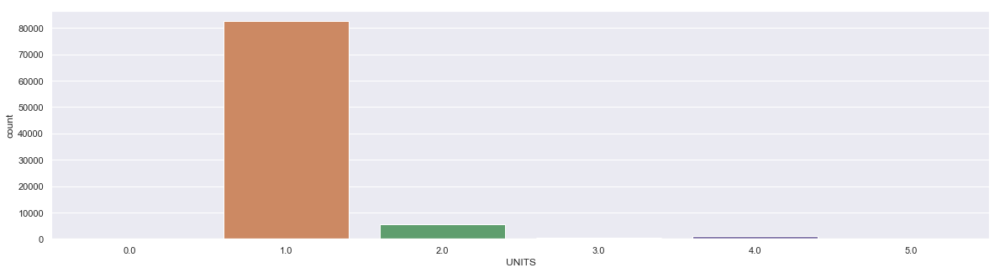

In [53]:
udf = finaldf.copy()
udf = udf['UNITS']

plt.figure(figsize=(20,5))
a = sns.countplot(udf)

Text(0.5, 0, 'UNITS')

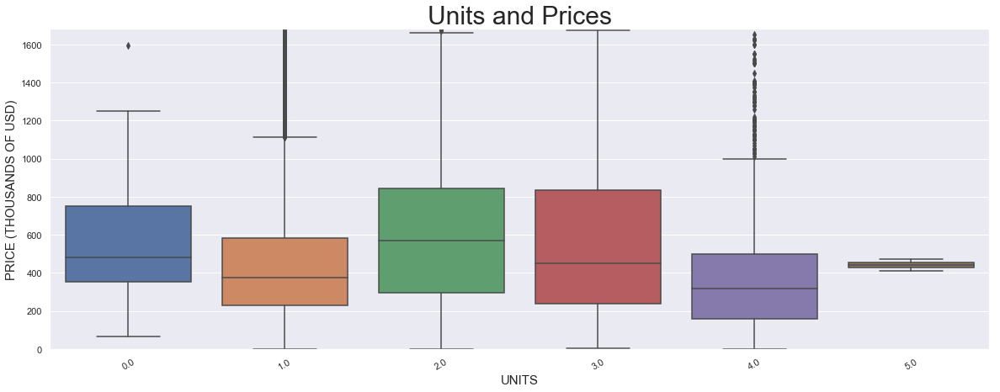

In [54]:

sns.set()
plt.figure(figsize=(20, 7))
g = sns.boxplot(x=udf, y=price_thousands)
g.set(ylim=(0, max(price_thousands)))
g.tick_params(axis='x', rotation=30)
plt.title("Units and Prices", size=30)
plt.ylabel('PRICE (THOUSANDS OF USD)', size=15)
plt.xlabel('UNITS', size=15)

### STORIES ON PRICE:

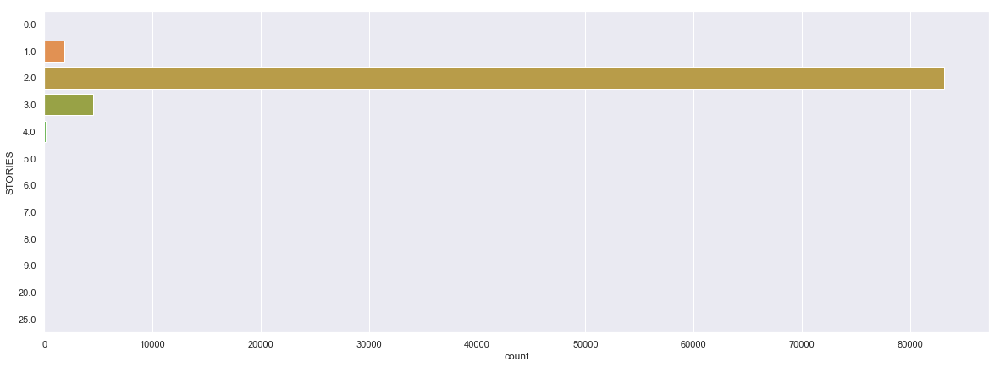

In [55]:
plt.figure(figsize=(20, 7))
sns.countplot(y=finaldf.STORIES)

Text(0.5, 0, 'STORIES')

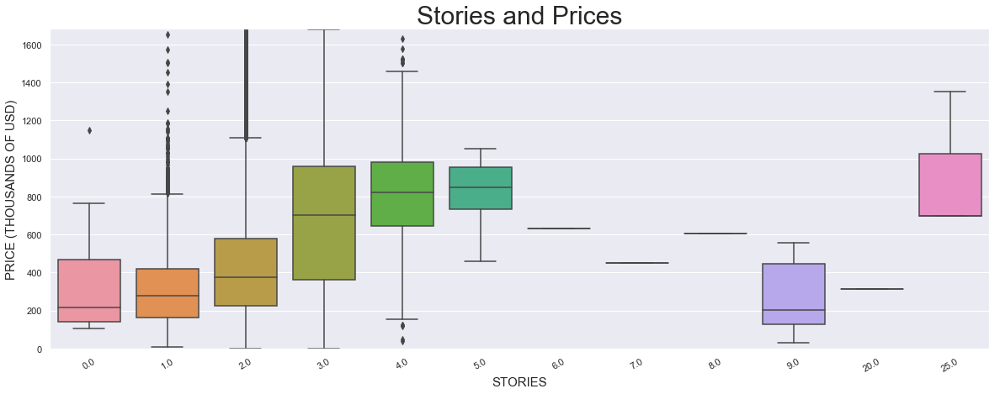

In [56]:
sns.set()
plt.figure(figsize=(20, 7))
g = sns.boxplot(x=finaldf.STORIES, y=price_thousands)
g.set(ylim=(0, max(price_thousands)))
g.tick_params(axis='x', rotation=30)
plt.title("Stories and Prices", size=30)
plt.ylabel('PRICE (THOUSANDS OF USD)', size=15)
plt.xlabel('STORIES', size=15)

In [57]:
finaldf.STORIES.value_counts().sort_index()

0.0        11
1.0      1879
2.0     83137
3.0      4557
4.0       139
5.0         8
6.0         1
7.0         1
8.0         1
9.0        14
20.0        1
25.0        3
Name: STORIES, dtype: int64

#### TAKEAWAYS:
* Prices increase with buildings up to five floors.
* We do not know much about the prices for high-rise buildings, as we only have less than 25 samples.

### GRADES AND PRICES

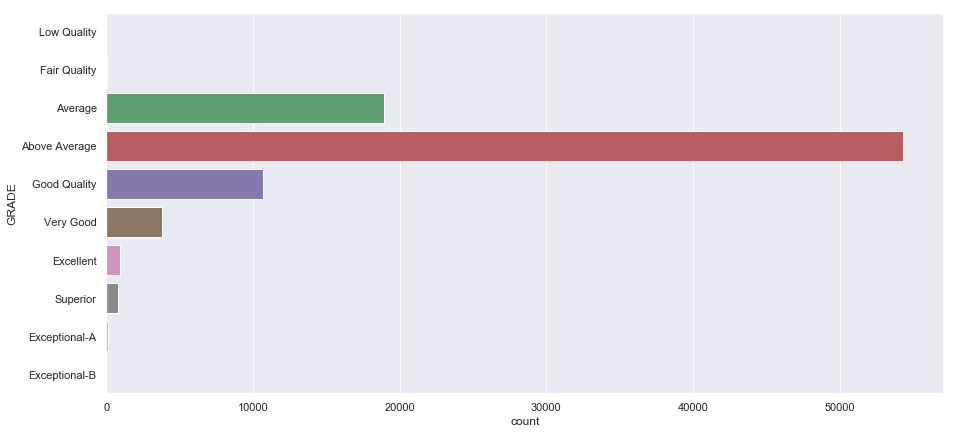

In [58]:
cat_values=pd.api.types.CategoricalDtype(
            categories=['Low Quality', 'Fair Quality', 'Average', 'Above Average', 'Good Quality', \
            'Very Good', 'Excellent', 'Superior', 'Exceptional-A', 'Exceptional-B'], ordered=True)
finaldf.GRADE = finaldf['GRADE'].astype(cat_values)

plt.figure(figsize=(15,7))
sns.countplot(y=finaldf.GRADE)

Text(0.5, 0, 'GRADE')

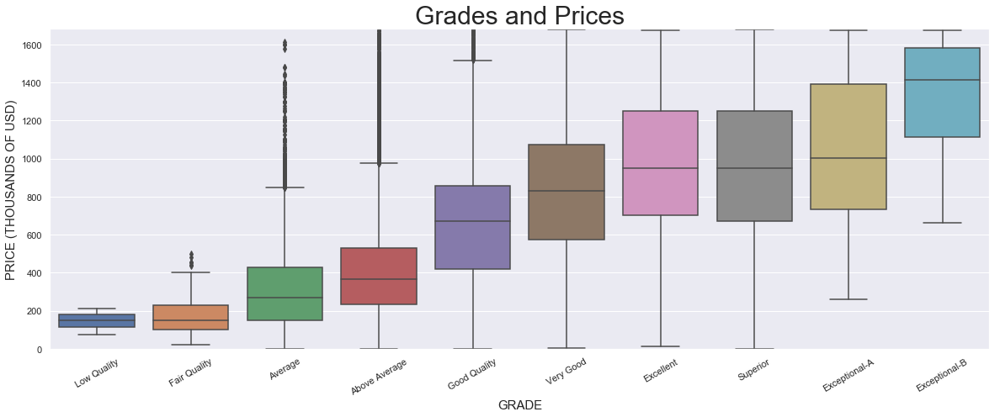

In [59]:

sns.set()
plt.figure(figsize=(20, 7))
g = sns.boxplot(x=finaldf.GRADE, y=price_thousands)
g.set(ylim=(0, max(price_thousands)))
g.tick_params(axis='x', rotation=30)
plt.title("Grades and Prices", size=30)
plt.ylabel('PRICE (THOUSANDS OF USD)', size=15)
plt.xlabel('GRADE', size=15)

In [60]:
finaldf.GRADE.value_counts()

Above Average    54347
Average          18948
Good Quality     10688
Very Good         3837
Excellent          972
Superior           774
Exceptional-A       98
Fair Quality        77
Exceptional-B        8
Low Quality          3
Name: GRADE, dtype: int64

#### TAKEAWAYS:
* GRADE has a very significant impact on price. 
* Price correlates directly with each step in grade.

### CONDITION ON PRICE: 

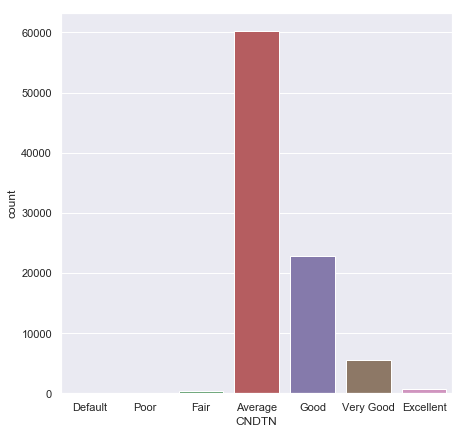

In [61]:
cat_values=pd.api.types.CategoricalDtype(
            categories=['Default', 'Poor', 'Fair', 'Average', 'Good', 'Very Good', 'Excellent'], ordered=True)

finaldf.CNDTN = finaldf['CNDTN'].astype(cat_values)

plt.figure(figsize=(7, 7))
a = sns.countplot(finaldf.CNDTN)

Text(0.5, 0, 'CONDITION')

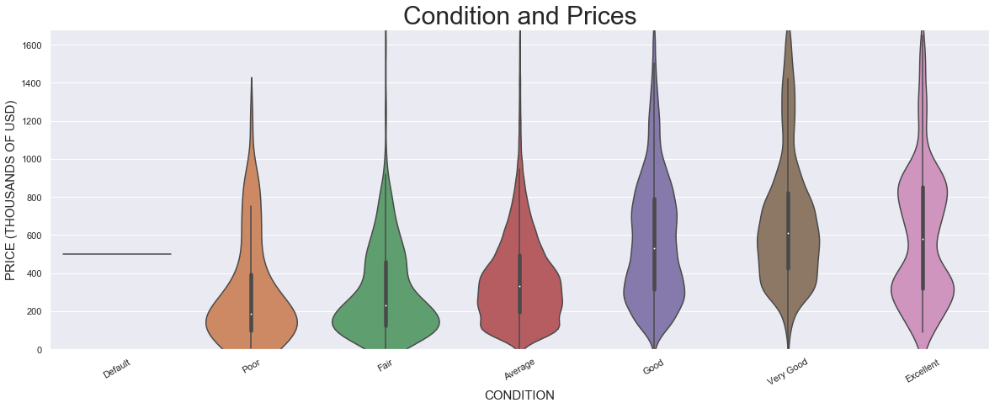

In [62]:

sns.set()
plt.figure(figsize=(20, 7))
g = sns.violinplot(x=finaldf.CNDTN, y=price_thousands)
g.set(ylim=(0, max(price_thousands)))
g.tick_params(axis='x', rotation=30)
plt.title("Condition and Prices", size=30)
plt.ylabel('PRICE (THOUSANDS OF USD)', size=15)
plt.xlabel('CONDITION', size=15)

In [63]:
finaldf.CNDTN.value_counts()

Average      60254
Good         22795
Very Good     5530
Excellent      659
Fair           438
Poor            75
Default          1
Name: CNDTN, dtype: int64

#### TAKEAWAYS:
* Condition has a significant impact on price
* It is uncertain whether there is a difference in price between "Very Good" and "Excellent" condition properties

### LAND AREA, BUILDING AREA, and LIVING AREA on PRICE

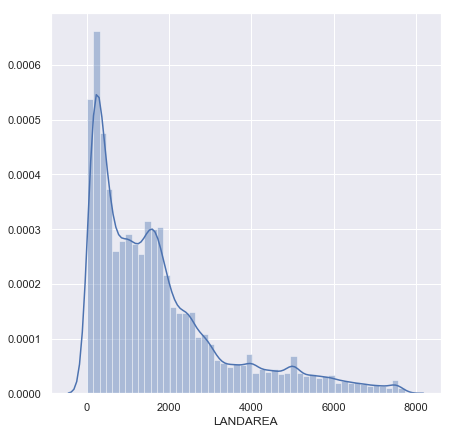

In [66]:
plt.figure(figsize=(7,7))
sns.distplot(finaldf.LANDAREA)

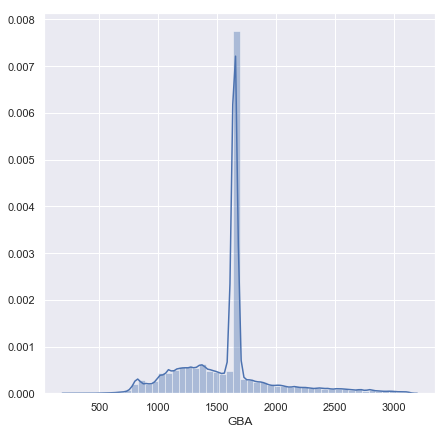

In [67]:
plt.figure(figsize=(7,7))
sns.distplot(finaldf.GBA)

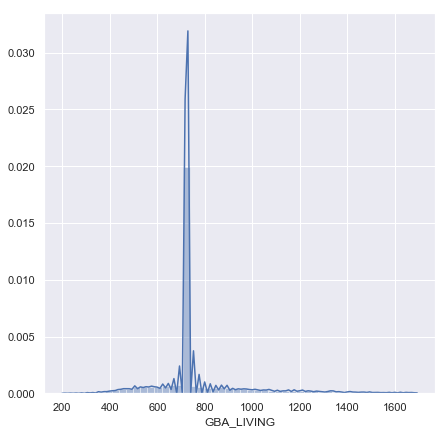

In [68]:
plt.figure(figsize=(7,7))
sns.distplot(finaldf.GBA_LIVING)

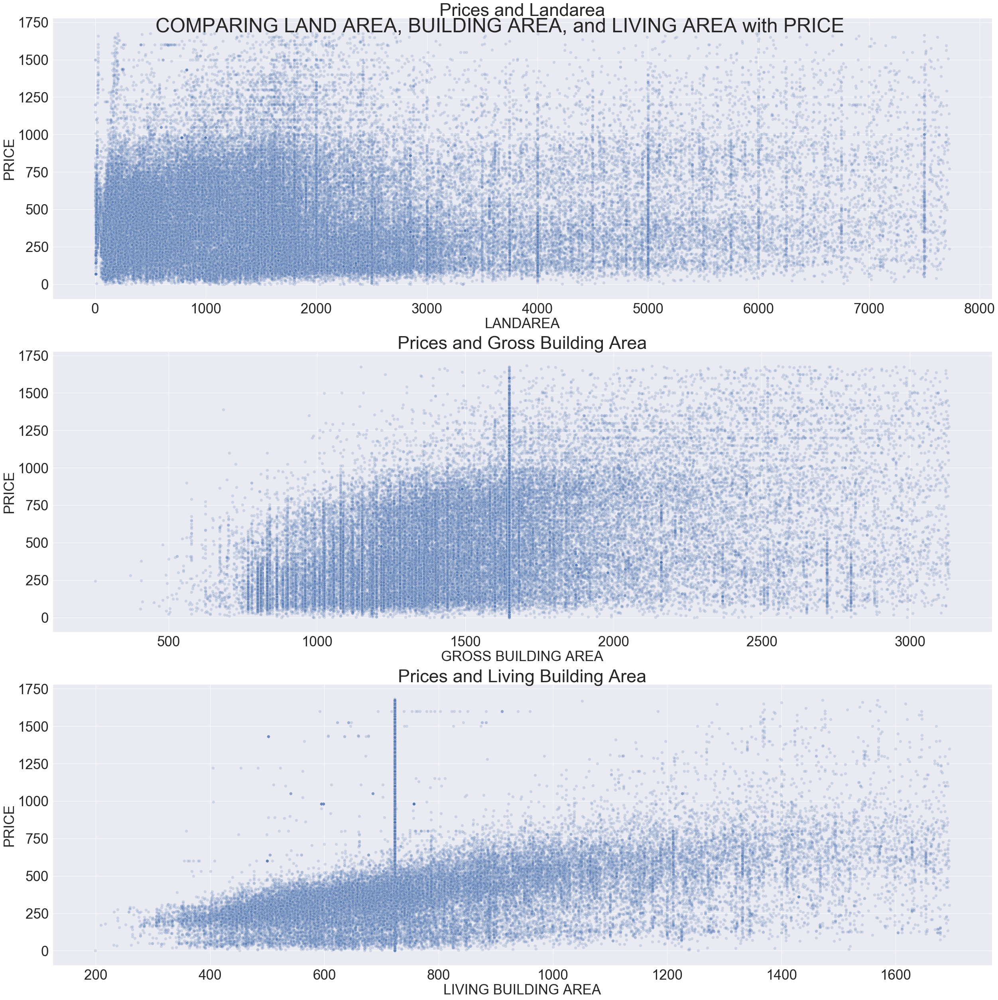

In [69]:
area = finaldf.copy()
area['PRICE'] = area['PRICE']/1000

sns.set()
fig, axarr = plt.subplots(3, 1, sharey=True, figsize=(35, 35))
fig.suptitle('COMPARING LAND AREA, BUILDING AREA, and LIVING AREA with PRICE', fontsize=50)  

zero = sns.relplot(x='LANDAREA', y='PRICE', data=area, alpha=.2, ax=axarr[0], s=60)
axarr[0].set_title("Prices and Landarea", size=45)
axarr[0].tick_params(axis='x', labelsize=35)
axarr[0].tick_params(axis='y', labelsize=35)
axarr[0].set_xlabel('LANDAREA', size=35)
axarr[0].set_ylabel('PRICE', size=35)

one = sns.relplot(x='GBA', y='PRICE', data=area, alpha=.2, ax=axarr[1], s=60)
axarr[1].set_title("Prices and Gross Building Area", size=45)
axarr[1].tick_params(axis='x', labelsize=35)
axarr[1].tick_params(axis='y', labelsize=35)
axarr[1].set_xlabel('GROSS BUILDING AREA', size=35)
axarr[1].set_ylabel('PRICE', size=35)

two = sns.relplot(x='GBA_LIVING', y='PRICE', data=area, alpha=.2, ax=axarr[2], s=60)
axarr[2].set_title("Prices and Living Building Area", size=45)
axarr[2].tick_params(axis='x', labelsize=35)
axarr[2].tick_params(axis='y', labelsize=35)
axarr[2].set_xlabel('LIVING BUILDING AREA', size=35)
axarr[2].set_ylabel('PRICE', size=35)

#close extra figures
plt.close(zero.fig)
plt.close(one.fig) 
plt.close(two.fig) 
plt.tight_layout()

Statistic=106888.014, p=0.000
Variance is not homogeneous (reject H0).
The correlation coefficient: 0.069 indicates a negligible monotonic relationship


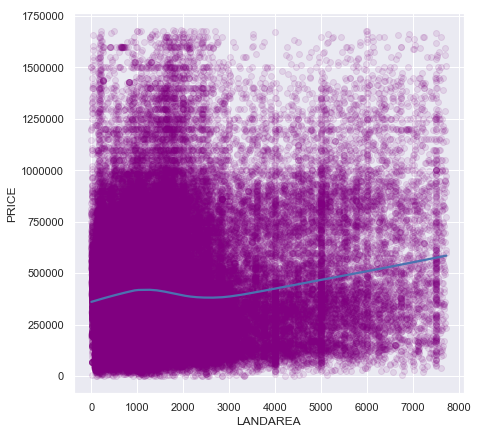

In [71]:
#LANDAREA

#Test for homogeneity of variance:
stat, p = stats.levene(finaldf['PRICE'], finaldf['LANDAREA'])
print('Statistic=%.3f, p=%.3f' % (stat, p))
if p > alpha:
    print('Variance is homogeneous (fail to reject H0).')
else:
    print('Variance is not homogeneous (reject H0).')
    
#Test for correlation:
r = finaldf['PRICE'].corr(finaldf['LANDAREA'], method='spearman')
if r > .7:
    print("The correlation coefficient: %.3f indicates a strong positive monotonic relationship" % r) 
elif r > .3:
    print("The correlation coefficient: %.3f indicates a moderate positive monotonic relationship" % r) 
elif r > .1:
    print("The correlation coefficient: %.3f indicates a weak positive monotonic relationship" % r) 
elif r > -.1:
    print("The correlation coefficient: %.3f indicates a negligible monotonic relationship" % r) 
elif r > -.3:
    print("The correlation coefficient: %.3f indicates a weak negative monotonic relationship" % r)
elif r > -.7:
    print("The correlation coefficient: %.3f indicates a moderate negative monotonic relationship" % r) 
else:
    print("The correlation coefficient: %.3f indicates a strong negative monotonic relationship" % r)
    
plt.figure(figsize=(7,7))
sns.regplot(x=finaldf['LANDAREA'], y=finaldf['PRICE'],lowess=True, \
                 scatter_kws={'alpha':.1, 'color':'purple'}, fit_reg=True)

In [ ]:
#GBA

#Test for homogeneity of variance:
stat, p = stats.levene(finaldf['GBA'], finaldf['X'])
print('Statistic=%.3f, p=%.3f' % (stat, p))
if p > alpha:
    print('Variance is homogeneous (fail to reject H0).')
else:
    print('Variance is not homogeneous (reject H0).')
    
#Test for correlation:
r = finaldf['PRICE'].corr(finaldf['GBA'], method='spearman')
if r > .7:
    print("The correlation coefficient: %.3f indicates a strong positive linear relationship" % r) 
elif r > .3:
    print("The correlation coefficient: %.3f indicates a moderate positive linear relationship" % r) 
elif r > .1:
    print("The correlation coefficient: %.3f indicates a weak positive linear relationship" % r) 
elif r > -.1:
    print("The correlation coefficient: %.3f indicates a negligible linear relationship." % r) 
elif r > -.3:
    print("The correlation coefficient: %.3f indicates a weak negative linear relationship" % r)
elif r > -.7:
    print("The correlation coefficient: %.3f indicates a moderate negative linear relationship" % r) 
else:
    print("The correlation coefficient: %.3f indicates a strong negative linear relationship" % r)
    
plt.figure(figsize(7,7))
sns.regplot(x=finaldf['GBA'], y=finaldf['PRICE'],lowess=True, \
                 scatter_kws={'alpha':.1, 'color':'purple'}, fit_reg=True)

Statistic=107943.809, p=0.000
Variance is not homogeneous (reject H0).
The correlation coefficient: 0.275 indicates a weak positive linear relationship


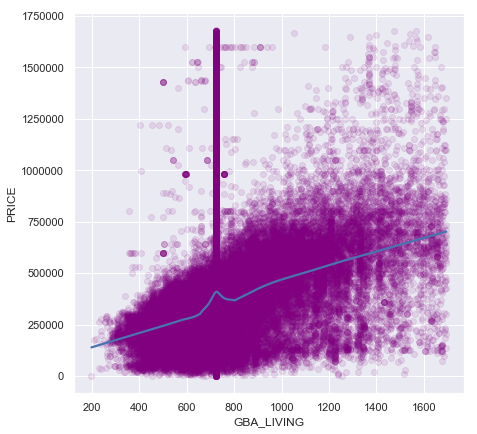

In [72]:
#LIVING GBA

#Test for homogeneity of variance:
stat, p = stats.levene(finaldf['PRICE'], finaldf['GBA_LIVING'])
print('Statistic=%.3f, p=%.3f' % (stat, p))
if p > alpha:
    print('Variance is homogeneous (fail to reject H0).')
else:
    print('Variance is not homogeneous (reject H0).')
    
#Test for correlation:
r = finaldf['PRICE'].corr(finaldf['GBA_LIVING'], method='spearman')
if r > .7:
    print("The correlation coefficient: %.3f indicates a strong positive linear relationship" % r) 
elif r > .3:
    print("The correlation coefficient: %.3f indicates a moderate positive linear relationship" % r) 
elif r > .1:
    print("The correlation coefficient: %.3f indicates a weak positive linear relationship" % r) 
elif r > -.1:
    print("The correlation coefficient: %.3f indicates a negligible linear relationship." % r) 
elif r > -.3:
    print("The correlation coefficient: %.3f indicates a weak negative linear relationship" % r)
elif r > -.7:
    print("The correlation coefficient: %.3f indicates a moderate negative linear relationship" % r) 
else:
    print("The correlation coefficient: %.3f indicates a strong negative linear relationship" % r)
    
plt.figure(figsize=(7,7))
sns.regplot(x=finaldf['GBA_LIVING'], y=finaldf['PRICE'],lowess=True, \
                 scatter_kws={'alpha':.1, 'color':'purple'}, fit_reg=True)

#### TAKEAWAYS:
* LANDAREA and PRICE have a negligible linear relationship.
* GROSS BUILDING AREA and PRICE have a weak positive linear relationship.
* LIVING GBA and PRICE have a weak positive linear relationship.

### BUILDING HISTORY on PRICE (YR_ORIGIN, YR_EXT, and YR_RMDL on PRICE)

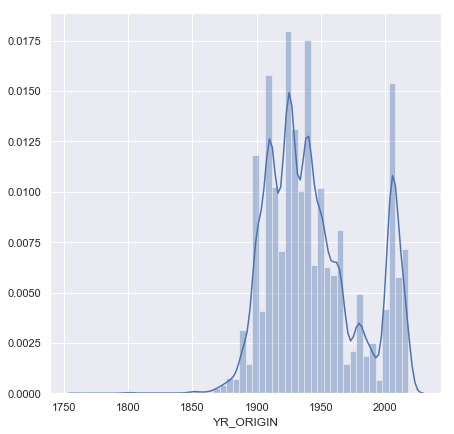

In [73]:
plt.figure(figsize=(7,7))
sns.distplot(finaldf.YR_ORIGIN)

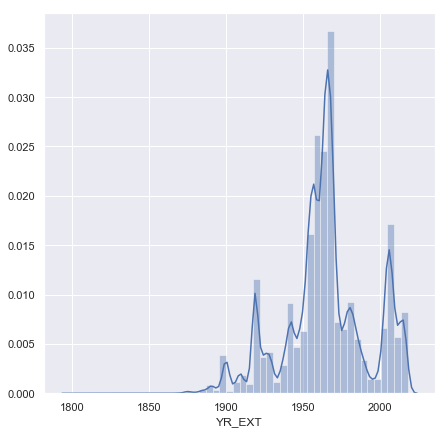

In [74]:
plt.figure(figsize=(7,7))
sns.distplot(finaldf.YR_EXT)

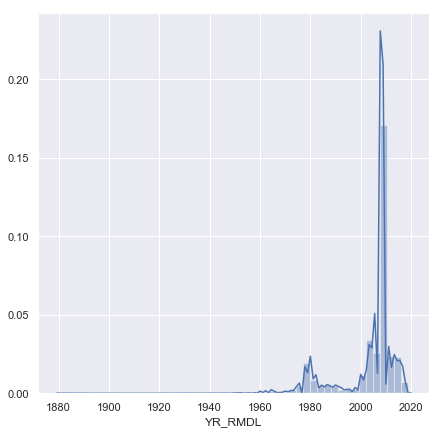

In [75]:
plt.figure(figsize=(7,7))
sns.distplot(finaldf.YR_RMDL)

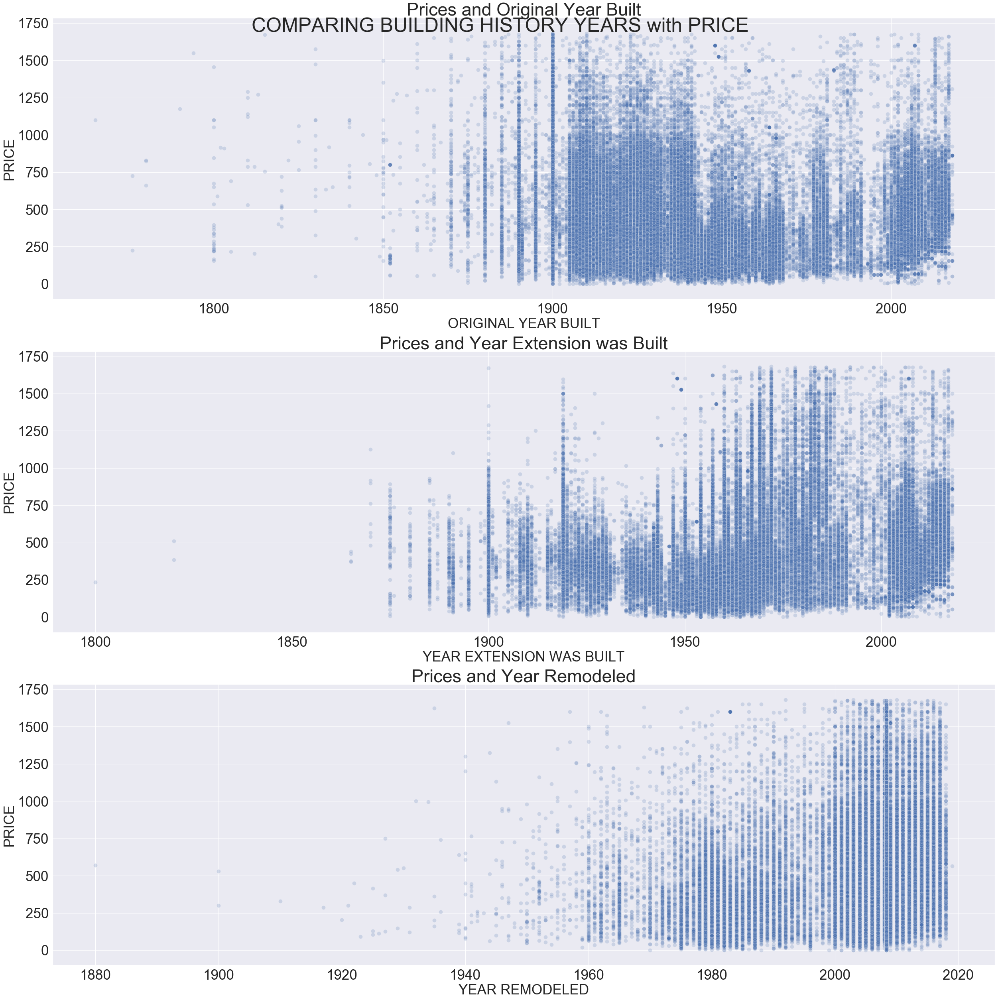

In [76]:
hist = finaldf.copy()
hist['PRICE'] = hist['PRICE']/1000

sns.set()
fig, axarr = plt.subplots(3, 1, sharey=True, figsize=(35, 35))
fig.suptitle('COMPARING BUILDING HISTORY YEARS with PRICE', fontsize=50)  

zero = sns.relplot(x='YR_ORIGIN', y='PRICE', data=hist, alpha=.2, ax=axarr[0], s=100)
axarr[0].set_title("Prices and Original Year Built", size=45)
axarr[0].tick_params(axis='x', labelsize=35)
axarr[0].tick_params(axis='y', labelsize=35)
axarr[0].set_xlabel('ORIGINAL YEAR BUILT', size=35)
axarr[0].set_ylabel('PRICE', size=35)

one = sns.relplot(x='YR_EXT', y='PRICE', data=hist, alpha=.2, ax=axarr[1], s=100)
axarr[1].set_title("Prices and Year Extension was Built", size=45)
axarr[1].tick_params(axis='x', labelsize=35)
axarr[1].tick_params(axis='y', labelsize=35)
axarr[1].set_xlabel('YEAR EXTENSION WAS BUILT', size=35)
axarr[1].set_ylabel('PRICE', size=35)

two = sns.relplot(x='YR_RMDL', y='PRICE', data=hist, alpha=.2, ax=axarr[2], s=100)
axarr[2].set_title("Prices and Year Remodeled", size=45)
axarr[2].tick_params(axis='x', labelsize=35)
axarr[2].tick_params(axis='y', labelsize=35)
axarr[2].set_xlabel('YEAR REMODELED', size=35)
axarr[2].set_ylabel('PRICE', size=35)

#close extra figures
plt.close(zero.fig)
plt.close(one.fig) 
plt.close(two.fig) 
plt.tight_layout()

Statistic=108013.449, p=0.000
Variance is not homogeneous (reject H0).
The correlation coefficient: -0.133 indicates a weak negative monotonic relationship


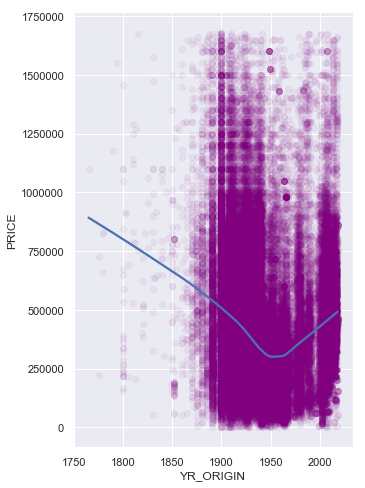

In [77]:
#ORIGINAL YEAR

#Test for homogeneity of variance:
stat, p = stats.levene(finaldf['PRICE'], finaldf['YR_ORIGIN'])
print('Statistic=%.3f, p=%.3f' % (stat, p))
if p > alpha:
    print('Variance is homogeneous (fail to reject H0).')
else:
    print('Variance is not homogeneous (reject H0).')
    
#Test for correlation:
r = finaldf['PRICE'].corr(finaldf['YR_ORIGIN'], method='spearman')
if r > .7:
    print("The correlation coefficient: %.3f indicates a strong positive monotonic relationship" % r) 
elif r > .3:
    print("The correlation coefficient: %.3f indicates a moderate positive monotonic relationship" % r) 
elif r > .1:
    print("The correlation coefficient: %.3f indicates a weak positive monotonic relationship" % r) 
elif r > -.1:
    print("The correlation coefficient: %.3f indicates a negligible monotonic relationship" % r) 
elif r > -.3:
    print("The correlation coefficient: %.3f indicates a weak negative monotonic relationship" % r)
elif r > -.7:
    print("The correlation coefficient: %.3f indicates a moderate negative monotonic relationship" % r) 
else:
    print("The correlation coefficient: %.3f indicates a strong negative monotonic relationship" % r)

plt.figure(figsize=(5, 8))
sns.regplot(x=finaldf['YR_ORIGIN'], y=finaldf['PRICE'],lowess=True, \
                 scatter_kws={'alpha':.05, 'color':'purple'}, fit_reg=True)

In [78]:
#EXTENSION YEAR

#Test for homogeneity of variance:
stat, p = stats.levene(finaldf['PRICE'], finaldf['YR_EXT'])
print('Statistic=%.3f, p=%.3f' % (stat, p))
if p > alpha:
    print('Variance is homogeneous (fail to reject H0).')
else:
    print('Variance is not homogeneous (reject H0).')
    
#Test for correlation:
r = finaldf['PRICE'].corr(finaldf['YR_EXT'], method='spearman')
if r > .7:
    print("The correlation coefficient: %.3f indicates a strong positive linear relationship" % r) 
elif r > .3:
    print("The correlation coefficient: %.3f indicates a moderate positive linear relationship" % r) 
elif r > .1:
    print("The correlation coefficient: %.3f indicates a weak positive linear relationship" % r) 
elif r > -.1:
    print("The correlation coefficient: %.3f indicates a negligible linear relationship." % r) 
elif r > -.3:
    print("The correlation coefficient: %.3f indicates a weak negative linear relationship" % r)
elif r > -.7:
    print("The correlation coefficient: %.3f indicates a moderate negative linear relationship" % r) 
else:
    print("The correlation coefficient: %.3f indicates a strong negative linear relationship" % r)
    
plt.figure(figsize=(5, 8))
sns.regplot(x=finaldf['YR_EXT'], y=finaldf['PRICE'],lowess=True, \
                 scatter_kws={'alpha':.05, 'color':'purple'}, fit_reg=True)

Statistic=108021.921, p=0.000
Variance is not homogeneous (reject H0).
The correlation coefficient: 0.309 indicates a moderate positive linear relationship


NameError: name 'figsize' is not defined

Statistic=108035.436, p=0.000
Variance is not homogeneous (reject H0).
The correlation coefficient: 0.163 indicates a weak positive monotonic relationship


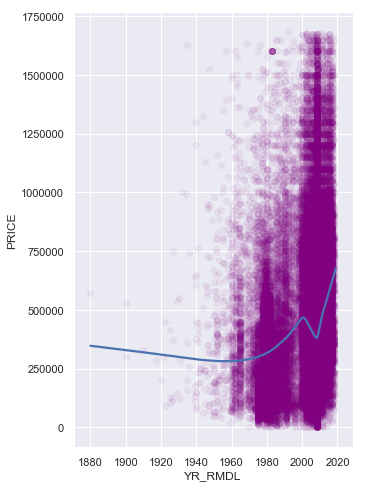

In [79]:
#YEAR REMODELED

#Test for homogeneity of variance:
stat, p = stats.levene(finaldf['PRICE'], finaldf['YR_RMDL'])
print('Statistic=%.3f, p=%.3f' % (stat, p))
if p > alpha:
    print('Variance is homogeneous (fail to reject H0).')
else:
    print('Variance is not homogeneous (reject H0).')
    
#Test for correlation:
r = finaldf['PRICE'].corr(finaldf['YR_RMDL'], method='spearman')
if r > .7:
    print("The correlation coefficient: %.3f indicates a strong positive monotonic relationship" % r) 
elif r > .3:
    print("The correlation coefficient: %.3f indicates a moderate positive monotonic relationship" % r) 
elif r > .1:
    print("The correlation coefficient: %.3f indicates a weak positive monotonic relationship" % r) 
elif r > -.1:
    print("The correlation coefficient: %.3f indicates a negligible monotonic relationship" % r) 
elif r > -.3:
    print("The correlation coefficient: %.3f indicates a weak negative monotonic relationship" % r)
elif r > -.7:
    print("The correlation coefficient: %.3f indicates a moderate negative monotonic relationship" % r) 
else:
    print("The correlation coefficient: %.3f indicates a strong negative monotonic relationship" % r)
    
plt.figure(figsize=(5, 8))
sns.regplot(x=finaldf['YR_RMDL'], y=finaldf['PRICE'],lowess=True, \
                 scatter_kws={'alpha':.05, 'color':'purple'}, fit_reg=True)

#### TAKEAWAYS: 
* Original year built has a negative relationship with price from 1750-1950, and positive relationship after 1950.
* Extension year and price have a moderate positive linear relationship. Extensions between 1940-1990 increased price.
* Recent remodeling (after 2010) has a strong linear relationship with price. Otherwise, there is a weak positive relationship between remodeling year and price.

### ROOMS on PRICE (ROOMS, BEDROOMS, BATHROOMS, and KITCHENS)

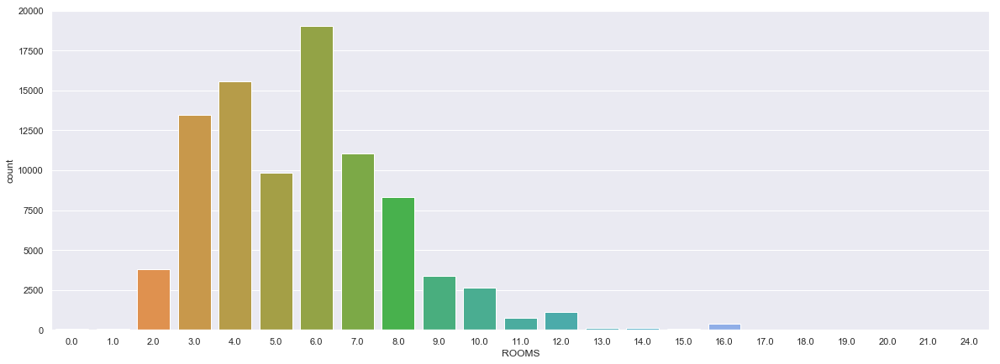

In [80]:
plt.figure(figsize=(20,7))
sns.countplot(finaldf.ROOMS)

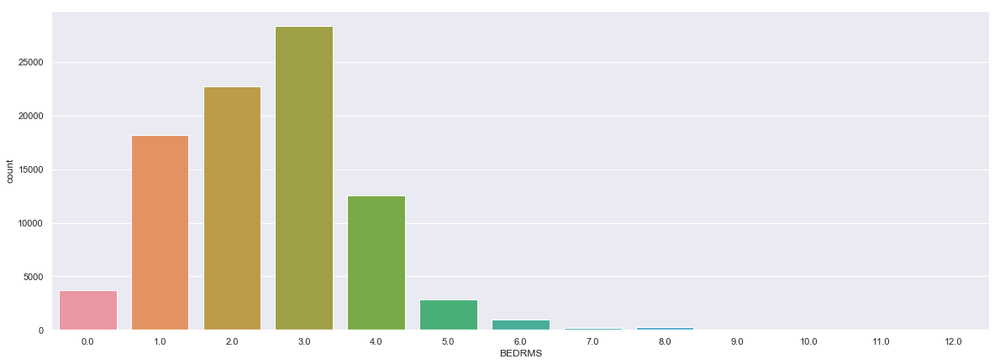

In [81]:
plt.figure(figsize=(20,7))
sns.countplot(finaldf.BEDRMS)

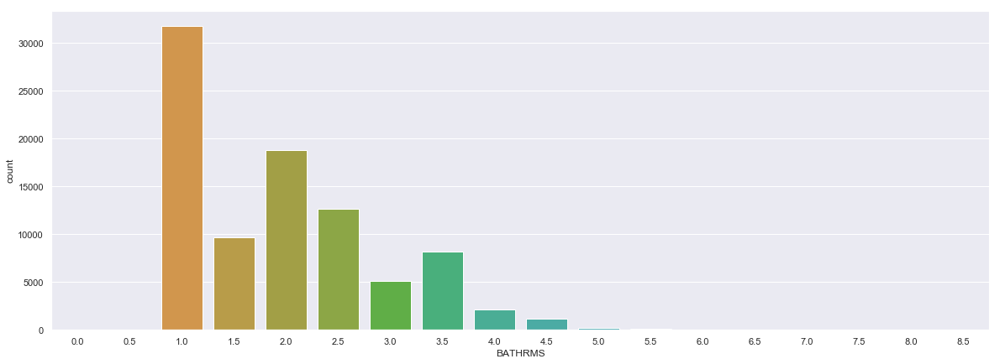

In [82]:
plt.figure(figsize=(20,7))
sns.countplot(finaldf.BATHRMS)

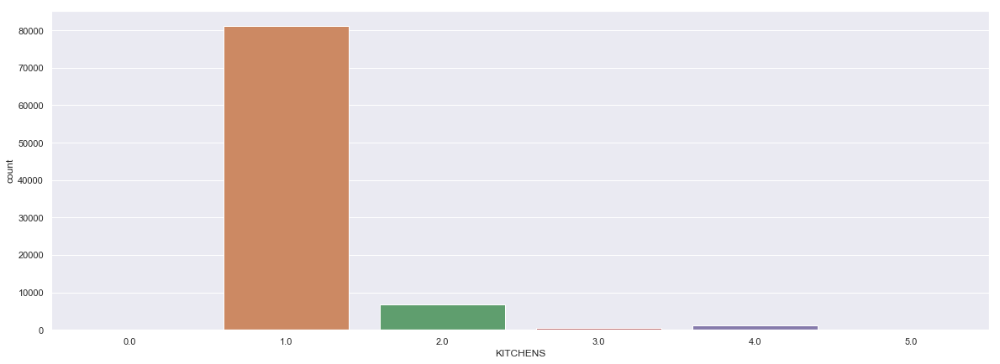

In [83]:
plt.figure(figsize=(20,7))
sns.countplot(finaldf.KITCHENS)

AttributeError: 'AxesSubplot' object has no attribute 'fig'

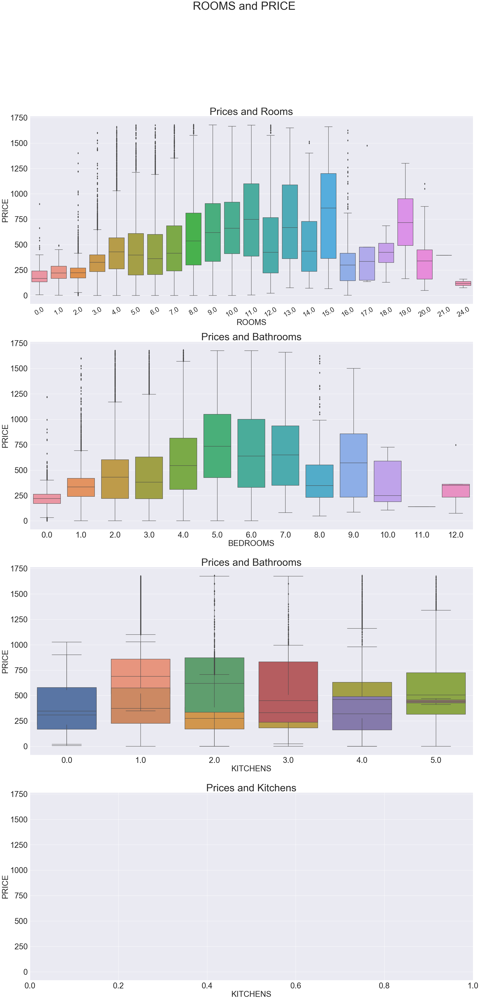

In [84]:
climate = finaldf.copy()
climate['PRICE'] = climate['PRICE']/1000
climate['KITCHENS'] = climate['KITCHENS'].round()

sns.set()
fig, axarr = plt.subplots(4, 1, sharey=True, figsize=(35, 70))
fig.suptitle('ROOMS and PRICE', fontsize=50)  

zero = sns.boxplot(x='ROOMS', y='PRICE', data=climate, ax=axarr[0])
axarr[0].set_title("Prices and Rooms", size=45)
axarr[0].tick_params(axis='x', labelsize=30, rotation=30)
axarr[0].tick_params(axis='y', labelsize=35)
axarr[0].set_xlabel('ROOMS', size=35)
axarr[0].set_ylabel('PRICE', size=35)

one = sns.boxplot(x='BEDRMS', y='PRICE', data=climate, ax=axarr[1])
axarr[1].set_title("Prices and Bathrooms", size=45)
axarr[1].tick_params(axis='x', labelsize=35)
axarr[1].tick_params(axis='y', labelsize=35)
axarr[1].set_xlabel('BEDROOMS', size=35)
axarr[1].set_ylabel('PRICE', size=35)

two = sns.boxplot(x='BATHRMS', y='PRICE', data=climate, ax=axarr[2])
axarr[2].set_title("Prices and Bathrooms", size=45)
axarr[2].tick_params(axis='x', labelsize=35)
axarr[2].tick_params(axis='y', labelsize=35)
axarr[2].set_xlabel('BATHROOMS', size=35)
axarr[2].set_ylabel('PRICE', size=35)

three = sns.boxplot(x='KITCHENS', y='PRICE', data=climate, ax=axarr[2])
axarr[3].set_title("Prices and Kitchens", size=45)
axarr[3].tick_params(axis='x', labelsize=35)
axarr[3].tick_params(axis='y', labelsize=35)
axarr[3].set_xlabel('KITCHENS', size=35)
axarr[3].set_ylabel('PRICE', size=35)

#close extra figures
plt.close(zero.fig)
plt.close(one.fig) 
plt.close(two.fig) 
plt.close(three.fig)

plt.tight_layout()

#### TAKEAWAYS:
* Prices increase up to 11 rooms
* Prices increase up to 5 bedrooms
* Prices increase up to 3.5 bathrooms. <br>
There are only 19 observations with zero or a half bathroom, so that jump in data is not significant.
* Prices increase up to 2 kitchens, and decrease after that. There are only 2 properties with 5 kitchens.

### CLIMATE CONTROL ON PRICE (HEAT, AC, FIREPLACE)

In [ ]:
plt.figure(figsize=(7,7))
sns.countplot(y=finaldf.HEAT)

In [ ]:
plt.figure(figsize=(7,7))
sns.countplot(finaldf.AC)

In [ ]:
plt.figure(figsize=(20,7))
sns.countplot(y=finaldf.FIREPLACES)

AttributeError: 'AxesSubplot' object has no attribute 'fig'

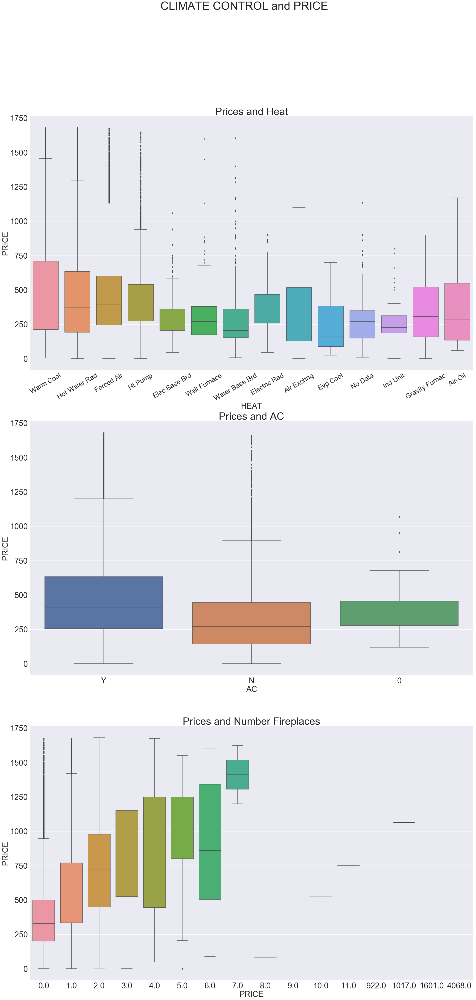

In [85]:
climate = finaldf.copy()
climate['PRICE'] = climate['PRICE']/1000

sns.set()
fig, axarr = plt.subplots(3, 1, sharey=True, figsize=(35, 70))
fig.suptitle('CLIMATE CONTROL and PRICE', fontsize=50)  

zero = sns.boxplot(x='HEAT', y='PRICE', data=climate, ax=axarr[0])
axarr[0].set_title("Prices and Heat", size=45)
axarr[0].tick_params(axis='x', labelsize=30, rotation=30)
axarr[0].tick_params(axis='y', labelsize=35)
axarr[0].set_xlabel('HEAT', size=35)
axarr[0].set_ylabel('PRICE', size=35)

one = sns.boxplot(x='AC', y='PRICE', data=climate, ax=axarr[1])
axarr[1].set_title("Prices and AC", size=45)
axarr[1].tick_params(axis='x', labelsize=35)
axarr[1].tick_params(axis='y', labelsize=35)
axarr[1].set_xlabel('AC', size=35)
axarr[1].set_ylabel('PRICE', size=35)

two = sns.boxplot(x='FIREPLACES', y='PRICE', data=climate, ax=axarr[2])
axarr[2].set_title("Prices and Number Fireplaces", size=45)
axarr[2].tick_params(axis='x', labelsize=35)
axarr[2].tick_params(axis='y', labelsize=35)
axarr[2].set_xlabel('PRICE', size=35)
axarr[2].set_ylabel('PRICE', size=35)

#close extra figures
plt.close(zero.fig)
plt.close(one.fig) 
plt.close(two.fig) 

plt.tight_layout()

#### TAKEAWAYS:
* Heat has some effect on price.
* Having AC correlates with higher prices.
* Costs increase with the number of fireplaces.

### STRUCTURAL FEATURES ON PRICE (ROOF, INTWALL, EXTWALL)

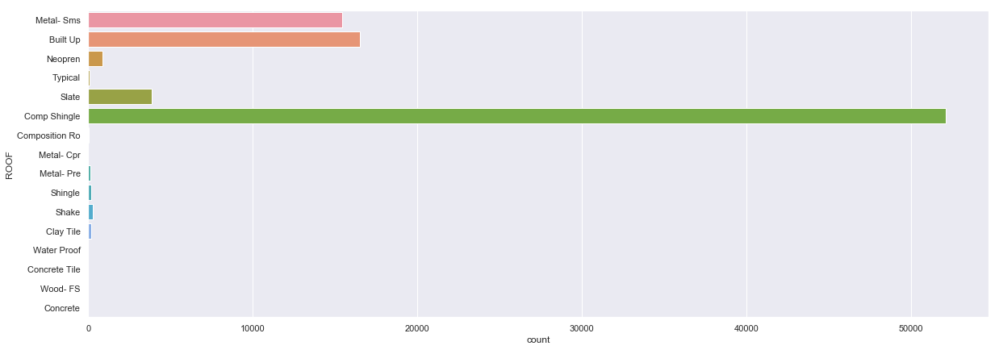

In [86]:
plt.figure(figsize=(20,7))
sns.countplot(y=finaldf.ROOF)

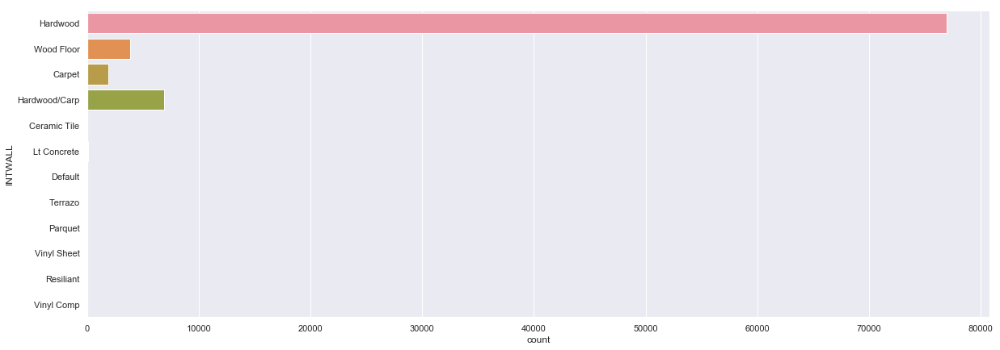

In [87]:
plt.figure(figsize=(20,7))
sns.countplot(y=finaldf.INTWALL)

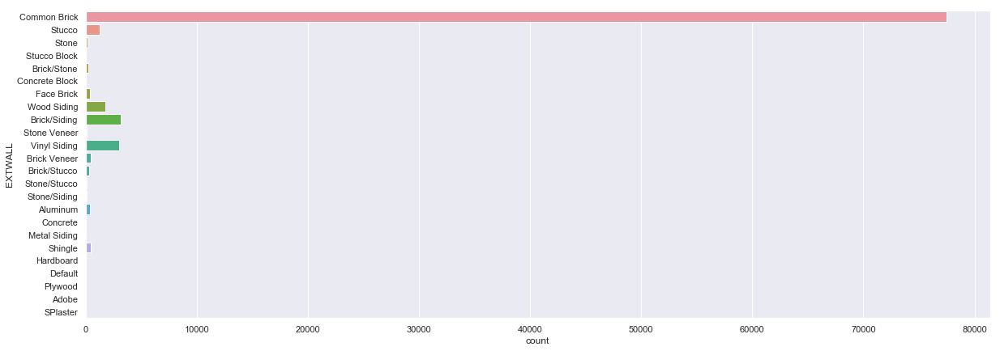

In [88]:
plt.figure(figsize=(20,7))
sns.countplot(y=finaldf.EXTWALL)

AttributeError: 'AxesSubplot' object has no attribute 'fig'

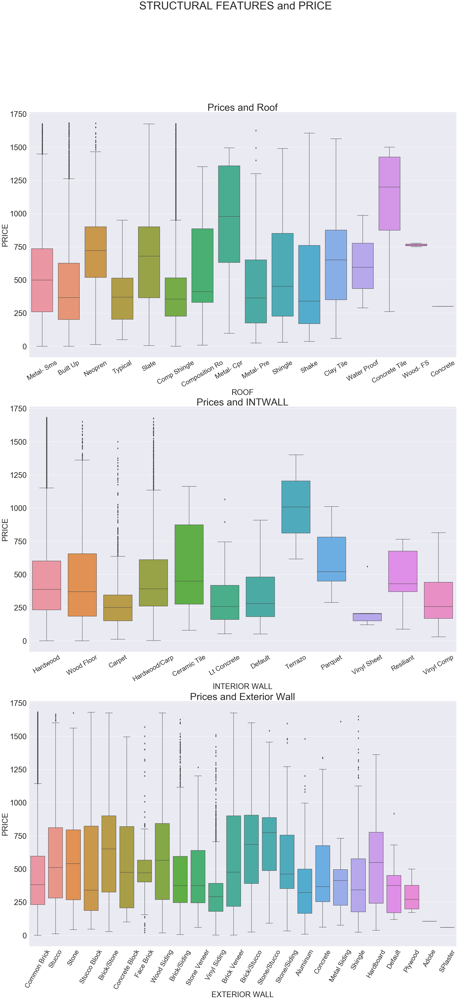

In [89]:
struct = finaldf.copy()
struct['PRICE'] = struct['PRICE']/1000

sns.set()
fig, axarr = plt.subplots(3, 1, sharey=True, figsize=(35, 70))
fig.suptitle('STRUCTURAL FEATURES and PRICE', fontsize=50)  

zero = sns.boxplot(x='ROOF', y='PRICE', data=struct, ax=axarr[0])
axarr[0].set_title("Prices and Roof", size=45)
axarr[0].tick_params(axis='x', labelsize=30, rotation=30)
axarr[0].tick_params(axis='y', labelsize=35)
axarr[0].set_xlabel('ROOF', size=35)
axarr[0].set_ylabel('PRICE', size=35)

one = sns.boxplot(x='INTWALL', y='PRICE', data=struct, ax=axarr[1])
axarr[1].set_title("Prices and INTWALL", size=45)
axarr[1].tick_params(axis='x', labelsize=30, rotation=30)
axarr[1].tick_params(axis='y', labelsize=35)
axarr[1].set_xlabel('INTERIOR WALL', size=35)
axarr[1].set_ylabel('PRICE', size=35)

two = sns.boxplot(x='EXTWALL', y='PRICE', data=struct, ax=axarr[2])
axarr[2].set_title("Prices and Exterior Wall", size=45)
axarr[2].tick_params(axis='x', labelsize=30, rotation=60)
axarr[2].tick_params(axis='y', labelsize=35)
axarr[2].set_xlabel('EXTERIOR WALL', size=35)
axarr[2].set_ylabel('PRICE', size=35)

#close extra figures
plt.close(zero.fig)
plt.close(one.fig) 
plt.close(two.fig) 

plt.tight_layout()

#### TAKEAWAYS:
* The vast majority of buildings are made of brick.
* All features have an impact on price.
* Looking at the graphs, some categories have very few observations. 